# Install package

In [1]:
# install community
# library(devtools)

# devtools::install_github("SoloveyMaria/community")

# Calculate communication

In [2]:
# libraries
library(community)
require(ggplot2)
require(gridExtra)
require(grid)
require(ComplexHeatmap)
require(dendsort)
require(igraph)
require(circlize)
require(R.utils)
require(data.table) #to read gz file
require(org.Hs.eg.db)
require(clusterProfiler)

Lade nötiges Paket: ggplot2

Lade nötiges Paket: gridExtra

Lade nötiges Paket: grid

Lade nötiges Paket: ComplexHeatmap

ComplexHeatmap version 2.14.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))


Lade nötiges Paket: dendsort

Lade nötiges Paket: igraph


Attache Paket: ‘igraph’


Die folgenden Objekte sind maskiert von ‘package:stats’:

    decompose, spectrum


Das folgend

In [3]:
getwd()

[1] "/Users/MariaSolovey/Documents/AML_niche_project/analysis/data/comparativeAnalysis/scripts_for_paper/communication_analysis/AML_healthy_Lasry"

In [4]:
# the path to the counts, cell annotation and sample annation file. In this case its our working dir same as
# the notebook
path_in <- getwd()

print("path_in")
print(path_in)

[1] "path_in"
[1] "/Users/MariaSolovey/Documents/AML_niche_project/analysis/data/comparativeAnalysis/scripts_for_paper/communication_analysis/AML_healthy_Lasry"


In [5]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.2/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.2/Resources/lib/libRlapack.dylib

locale:
[1] C/UTF-8/C/C/C/C

attached base packages:
[1] stats4    grid      stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] clusterProfiler_4.6.0 org.Hs.eg.db_3.16.0   AnnotationDbi_1.60.0 
 [4] IRanges_2.32.0        S4Vectors_0.36.1      Biobase_2.58.0       
 [7] BiocGenerics_0.44.0   data.table_1.14.6     R.utils_2.12.2       
[10] R.oo_1.25.0           R.methodsS3_1.8.2     circlize_0.4.15      
[13] igraph_1.3.5          dendsort_0.3.4        ComplexHeatmap_2.14.0
[16] gridExtra_2.3         ggplot2_3.4.0         community_1.2.1      

loaded via a namespace (and not attached):
  [1] ggtree_3.6.2           fgsea_1.24.0       

## Load data

To calculate interactions, we will need the following files: normalized and batch corrected `counts`, cell annotation file `anno_cells`, and a sample annotation file `anno_samples`.

The `counts` file contains normalized and batch corrected counts with genes in the rows and cell IDs in the columns.

The `anno_cells` file should contain columns named cell_ID, cell_type and sample_ID.

The `anno_sample` file should countan columns named sample_ID health_status (e.g. "healthy" or "AML") and case_or_conrol (e.g. "control" or "case").

In [6]:
data("LR_database")
print(str(LR_database))

'data.frame':	6857 obs. of  26 variables:
 $ Pair.Name            : chr  "ADAM10_AXL" "ADAM10_EPHA3" "ADAM12_ITGB1" "ADAM12_SDC4" ...
 $ Ligand               : chr  "ADAM10" "ADAM10" "ADAM12" "ADAM12" ...
 $ Ligand.Name          : chr  "ADAM metallopeptidase domain 10" "ADAM metallopeptidase domain 10" "ADAM metallopeptidase domain 12" "ADAM metallopeptidase domain 12" ...
 $ Receptor             : chr  "AXL" "EPHA3" "ITGB1" "SDC4" ...
 $ Receptor.Name        : chr  "AXL receptor tyrosine kinase" "EPH receptor A3" "integrin subunit beta 1" "syndecan 4" ...
 $ complex_pair         : chr  NA NA NA NA ...
 $ partner_a            : chr  "O14672" "O14672" "O43184" "O43184" ...
 $ partner_b            : chr  "P30530" "P29320" "P05556" "P31431" ...
 $ source               : chr  "O14672" "O14672" "O43184" "O43184" ...
 $ target               : chr  "P30530" "P29320" "P05556" "P31431" ...
 $ source_genesymbol    : chr  "ADAM10" "ADAM10" "ADAM12" "ADAM12" ...
 $ target_genesymbol    : chr  "AXL

In [7]:
# # load counts
print("load counts")
counts <- fread("counts_corr.csv.gz", header = TRUE)
counts <- as.data.frame(counts)
rownames(counts) <- counts$gene_symbol
counts <- counts[,-1]
print(str(counts))

[1] "load counts"


Warning message in fread("counts_corr.csv.gz", header = TRUE):
"Discarded single-line footer: <<FPR1,0.0,0.5810916310310683,0.0,0.0,0.0,0.0,0.5070338629614766,0.6026729299611555,0.5069838993514126,0.0,0.8989311347300231,0.0,0.5978919549917033,0.6969540196931739,1.0544538408133703,0.0,0.9995727459960846,0.5549651001813074,0.8886099451412535,0.0,0.0,0.7247527393390079,0.5090950416298741,0.0,0.0,0.9049150189987629,0.0,0.7312727128754095,0.0,0.9624947533247481,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6736555768971156,0.0,0.7446712918506131,0.0,0.9640432502516749,0.0,0.0,0.0,0.0,0.9652410148535776,0.0,0.0>>"


'data.frame':	14038 obs. of  46702 variables:
 $ 2020.09.15.AML0024.CATCAAGGTTAGCGGA           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CATCAAGTCCGAGAAG           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CATCCACAGGGACCAT           : num  0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACAGAGCAAGA           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACAGTTCCATG           : num  0 0.69 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACGTAGAATAC           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACGTTCTCCCA           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACTCCGAACGC           : num  0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCAACTCTAGTCAG           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCACAAGACAGTCG           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCACACAATTGCCA           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024.CCTCACACAGAACTAA           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ 2020.09.15.AML0024

In [8]:
# load cell annotation
print("load cell annotation")
anno_cells <- read.table(paste0(path_in,"/anno_cells_corr.txt")
                         ,sep = "\t"
                         ,row.names = 1
                         ,header = TRUE
                         )
print(str(anno_cells))

[1] "load cell annotation"
'data.frame':	46702 obs. of  93 variables:
 $ sample_ID                    : chr  "AML-0024" "AML-0024" "AML-0024" "AML-0024" ...
 $ cell                         : chr  "2020-09-15-AML0024:CATCAAGGTTAGCGGA" "2020-09-15-AML0024:CATCAAGTCCGAGAAG" "2020-09-15-AML0024:CATCCACAGGGACCAT" "2020-09-15-AML0024:CCTCAACAGAGCAAGA" ...
 $ UMAP_1                       : num  -0.731 -2.2 -2.867 -1.666 -0.972 ...
 $ UMAP_2                       : num  -15.8 -16.7 -16.1 -16.1 -17.5 ...
 $ orig.ident                   : chr  "2020-09-15-AML0024" "2020-09-15-AML0024" "2020-09-15-AML0024" "2020-09-15-AML0024" ...
 $ samples                      : chr  "AML0024" "AML0024" "AML0024" "AML0024" ...
 $ Broad_cell_identity          : chr  "CD14+ monocyte" "CD14+ monocyte" "CD16+ monocyte" "CD14+ monocyte" ...
 $ Cell_type_identity           : chr  "CD14+ IFN+" "CD14+" "CD16+" "CD14+ IFN+" ...
 $ clusters_res.2               : int  7 7 7 7 80 7 7 7 7 7 ...
 $ CNV_pos                   

In [9]:
# load sample annotation
print("load sample annotation")
anno_samples <- read.table(paste0(path_in,"/anno_samples_corr.txt")
                           ,sep = "\t"
                           ,row.names = 1
                           ,header = TRUE
                           )
print(str(anno_samples))

[1] "load sample annotation"
'data.frame':	13 obs. of  60 variables:
 $ Sample.ID                    : chr  "U-06-0024" "U-16-0160" "U-11-0693" "U-18-1371" ...
 $ sex                          : chr  "M" "M" "F" "M" ...
 $ Age                          : int  64 74 77 78 71 57 80 26 39 50 ...
 $ Sequencing                   : chr  "CITE-seq" "CITE-seq" "CITE-seq + scTCR-seq" "CITE-seq" ...
 $ sample_ID                    : chr  "AML-0024" "AML-0160" "AML-0693" "AML-1371" ...
 $ Institution                  : chr  "OSU" "OSU" "OSU" "OSU" ...
 $ Manuscript.ID                : chr  "AML0024" "AML0160" "AML0693" "AML1371" ...
 $ Dx                           : chr  "AML" "AML" "AML" "AML" ...
 $ DxELN_Cytogenetic            : chr  "Adverse" "Adverse" "Adverse" "" ...
 $ Cytogenetics                 : chr  "48,XY,+8,+8,i(8)(p10),t(9;15)(q33;q15),del(10)(q22.1q24),del(13)(q14q21)" "46,XY[30]" "74-89<4n>,XXXX,-8,-9,-9,-12,-17,i(17)(q10),+mar1,+mar2,+dmin[cp18]/46,XX[2] .ish dmin(amp CMYC)" "46,X

The ligand-receptor pair database is provided by the algorithm, but the user can also use a custom database. In this case, the custom database should have the columns named 'Ligand', 'Receptor' and 'Pair.Name'. 

## Thresholds

When calculation the interactions, it is possible to set three threshold: 
- `threshold_celltype_size` is a threshold for the minimum number of cells that a cell type should contain (in one sample). If the number of cells in the cell type of interest in a particular sample is less or equal to the `threshold_celltype_size`, then we consider this cell type as missing in this sample. This threshold affects the relative cell type abundance parameter (rho). The deafult value for the `threshold_celltype_size` is 4. 
- `threshold_nr_active_cells` is a threshold for the minimum number of active cells in a cell type (in the sample of interest). A cell is concidered as active (for a specific gene), if it is expressing this gene above the `threshold_expr`. If the number of active cells (for a specific gene) in a cell type is smaller or equal to the `threshold_nr_active_cells`, i.e. does not pass the threshold, then it is set to zero (in this sample). This threshold affects the relative active fraction (phi) parameter. The deafult value for the `threshold_expr` is zero.
- `threshold_expr` is a threshold for an expression value of a gene in a cell. If an expression value af a gene in a cell is smaller or equal to the `threshold_expr` value, it will be set to zero. This threshold affects the relative active fration (phi) and the relative mean expression (p) paramteres. The deafult value for the `threshold_expr` is zero. In our analysis, we will though set it arbtrarily to 0.05.

In [10]:
# set threshold of the cell type size
threshold_celltype_size <- 6
print("threshold_celltype_size >")
print(threshold_celltype_size)

[1] "threshold_celltype_size >"
[1] 6


In [11]:
# set threshold of the minimum number of active cells
threshold_nr_active_cells <- 6
print("threshold_nr_active_cells >")
print(threshold_nr_active_cells)

[1] "threshold_nr_active_cells >"
[1] 6


In [12]:
# set threshold of expression
threshold_expr <- 0.1
print("threshold_expr >")
print(threshold_expr)

[1] "threshold_expr >"
[1] 0.1


## Calculate interactions

In [13]:
# Renaming the cell_ID.1 column in anno_cells to "cell_ID"
colnames(anno_cells)[colnames(anno_cells) == "cell_ID.1"] <- "cell_ID"

In [30]:
print("calculate communication")
interactions = calculate_communication(counts = counts
                                       ,anno_samples = anno_samples
                                       ,anno_cells = anno_cells
                                       ,threshold_celltype_size = threshold_celltype_size
                                       ,threshold_nr_active_cells = threshold_nr_active_cells
                                       ,threshold_expr = threshold_expr
                                       ,lrp_database = LR_database
                                       )

# print(str(interactions))


[1] "calculate communication"


Warning message in e_cellType_gene(counts = counts_sub, anno_cells = anno_cells_sub, :
"WARNING: sample AML-0160 does not contain cell type NK -- interactions for this cell type in this sample will get zero values."
Warning message in e_cellType_gene(counts = counts_sub, anno_cells = anno_cells_sub, :
"WARNING: sample AML-2123 does not contain cell type DC -- interactions for this cell type in this sample will get zero values."
Warning message in e_cellType_gene(counts = counts_sub, anno_cells = anno_cells_sub, :
"WARNING: sample AML-4340 does not contain cell type Ery -- interactions for this cell type in this sample will get zero values."


## Calculate general statistics

The `general_stat` function calculates for each interaction several parameters that will be used for the QC, visualization and the differential communication analysis. 

Following parameters for the QC step will be stored in the `anno_interactions` list:
- mean expression of a ligand in the active fraction of the sending cell type within the control cohort (`mean_e_s_l_control`) and within the case cohort (`mean_e_s_l_case`). 
- mean  expression of a receptor in the active fraction of the receiving cell type within the control cohort (`mean_e_r_r_control`) and within the case cohort (`mean_e_r_r_case`).

Following parameters for the visulisation will be stored in the `anno_interactions` list:
- log2 fold change of `rho_s` between the cases and the controls (`log2FC_rho_s`). It shows for each interaction, how the cell type abundance of the sending cell type changed in the cases compared to the controls.
- log2 fold change of `rho_r` between the cases and the controls (`log2FC_rho_r_r`). It shows for each interaction, how the cell type abundance of the receiving cell type changed in the cases compared to the controls.
- log2 fold change of `rho` between the cases and the controls (`log2FC_rho`). It shows for each interaction, how the whole `rho` parameter changed in the cases compared to the controls.
- log2 fold change of `phi_l_s` between the cases and the controls (`log2FC_phi_l_s`). It shows for each interaction, how the active fraction of the ligand in the sending cells changed in the cases compared to the controls.
- log2 fold change of `phi_r_r` between the cases and the controls (`log2FC_phi_r_r`). It shows for each interaction, how the active fraction of the receptors in the receiving cells changed in the cases compared to the controls.
- log2 fold change of `phi` between the cases and the controls (`log2FC_phi`). It shows for each interaction, how the whole `phi` parameter changed in the cases compared to the controls.
- log2 fold change of `p_l_s` between the cases and the controls (`log2FC_p_l_s`). It shows for each interaction, how the mean expression whithin the active fraction of the ligand in the sending cells changed in the cases compared to the controls.
- log2 fold change of `p_r_r` between the cases and the controls (`log2FC_p_r_r`). It shows for each interaction, how the mean expression whithin the active fraction of the receptor in the receiving cells changed in the cases compared to the controls.
- log2 fold change of `p` between the cases and the controls (`log2FC_p`). It shows for each interaction, how the whole `p` parameter changed in the cases compared to the controls.

Following parameter for the differential communication analysis will be stored in the `anno_interactions` list:
- log2 fold change of `weights` between the cases and the controls (`log2FC_weights`). It shows for each interaction, how the whole interaction weight changed in the cases compared to the controls.


In [31]:
print("calculate general statistics")

interactions <- general_stat(comm_result = interactions
                                   ,verbose = FALSE#TRUE
)
print(str(interactions$anno_interactions))

[1] "calculate general statistics"
'data.frame':	117120 obs. of  19 variables:
 $ interaction_ID     : chr  "Mono:ADAM10_Mono:AXL" "Mono:ADAM12_Mono:ITGB1" "Mono:ADAM15_Mono:ITGA5" "Mono:ADAM15_Mono:ITGA9" ...
 $ ligand_gene_name   : chr  "ADAM10" "ADAM12" "ADAM15" "ADAM15" ...
 $ receptor_gene_name : chr  "AXL" "ITGB1" "ITGA5" "ITGA9" ...
 $ sending_cell_type  : chr  "Mono" "Mono" "Mono" "Mono" ...
 $ receiving_cell_type: chr  "Mono" "Mono" "Mono" "Mono" ...
 $ mean_e_s_l_control : num  0.804 0.498 0.796 0.796 0.819 ...
 $ mean_e_s_l_case    : num  0.775 0.336 0.749 0.749 0.821 ...
 $ mean_e_r_r_control : num  0.496 0.855 0.802 0.625 0.802 ...
 $ mean_e_r_r_case    : num  0.3 0.849 0.778 0.579 0.778 ...
 $ log2FC_rho_s       : num  -0.455 -0.455 -0.455 -0.455 -0.455 ...
 $ log2FC_rho_r       : num  -0.455 -0.455 -0.455 -0.455 -0.455 ...
 $ log2FC_rho         : num  0.145 0.145 0.145 0.145 0.145 ...
 $ log2FC_phi_s_l     : num  0.288 7.419 0.414 0.414 0.737 ...
 $ log2FC_phi_r_r     : 

# QC

For the quality check, we use three filters: the **interaction weight filter**, the **presense per cohort filter** and the **ligand/receptor expression filter**. An interaction is considered of good quality, if it passes all three filters.

The **interaction weight filter** checks the log10 cumulative weight of the interaction. To pass this filter, the interaction need to be greater than the `threshold_log10_cum_weight` threshold.

In [32]:
threshold_log10_cum_weight <-  0.01
print("threshold_log10_cum_weight >")
print(threshold_log10_cum_weight)

[1] "threshold_log10_cum_weight >"
[1] 0.01


The **presense per cohort filter** checks the fraction of samples in which an interaction was detected (i.e. has a non-zero value) in the control cohort and in the case cohort. To pass this filter, an interaction needs to has a greater value than the `threshold_frac_samples_per_condition` threshold either in the control cohort or in the case cohort or in both.

In [33]:
threshold_frac_samples_per_condition <-  0.6
print("threshold_frac_samples_per_condition >")
print(threshold_frac_samples_per_condition)

[1] "threshold_frac_samples_per_condition >"
[1] 0.6


The **ligand/receptor expression filter** checks the mean expression level of the ligand and the receptor of an interaction in the case and the control samples (separately). This filters uses a `threshold_log10meanexpr_per_condition` threshold.
For each einteraction four values are checked:
- log10 mean expression of the ligand in sending cells in control samples
- log10 mean expression of the receptor in receiving cells in control samples
- log10 mean expression of the ligand in sending cells in case samples
- log10 mean expression of the receptor in receiving ccells in case samples.


An interaction passes this filter if both its ligand and receptor pass the threshold either in control samples or in case samples or in both.

In [34]:
threshold_log10_meanexpr_per_condition <- 0.02
print("threshold_log10_meanexpr_per_condition >")
print(threshold_log10_meanexpr_per_condition)

[1] "threshold_log10_meanexpr_per_condition >"
[1] 0.02


A good quality interaction should pass all filters.

The `filter_interactions` function produces one plot for the **interaction weight filter**, two plots for the **presense per cohort filter** (one for the controls and one for the cases) and two plots for the **ligand/receptor expression filter** (one for the controls and one for the cases). It writes the selected threshold values in the `thresholds` list of the interaction object and stores the filtering results as boolean vectors (one per threshold) in the `anno_interactions` list. The function does not subset the data, so if you want to change the filtering parameters, you can re-define the thresholds and re-run the `filter_interactions` function.

[1] "filter weak interactions"


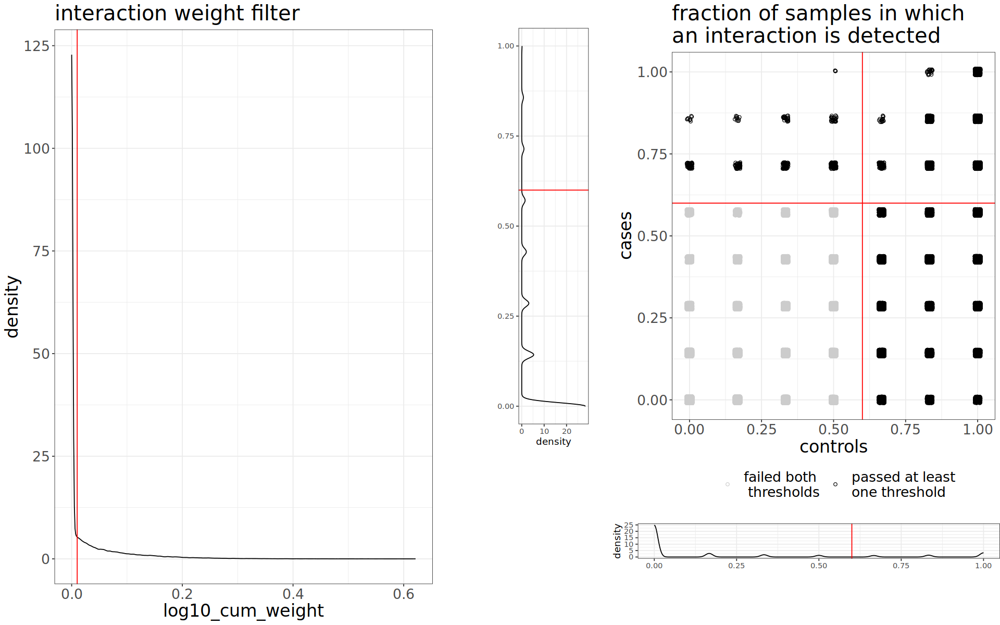

[1] "98926 out of 117120 interactions do not pass the thresholds for log10 cumulative interactions weight > 0.01 and fraction of expressing samples > 0.6 . Also  8801  interactions didn't pass the discrepancy filter.  In total, 98926  bad quality interactions will be removed and 18194 good quality interactions will remain."


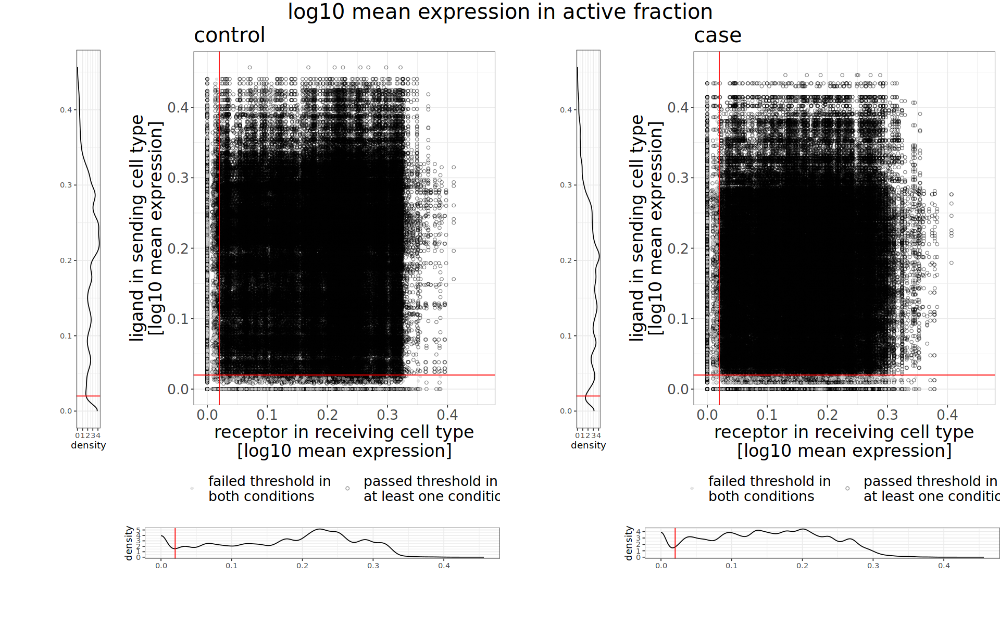

In [35]:
print("filter weak interactions")

options(repr.plot.height = 10
       ,repr.plot.width = 16)
interactions <- filter_interactions(comm_result = interactions
                             ,threshold_frac_samples_per_condition = threshold_frac_samples_per_condition
                             ,threshold_log10_cum_weight = threshold_log10_cum_weight
                             ,threshold_log10_meanexpr_per_condition = threshold_log10_meanexpr_per_condition
)

In [36]:
print(str(interactions$thresholds))
print(str(interactions$anno_interactions))

List of 6
 $ threshold_expr                        : num 0.1
 $ threshold_nr_active_cells             : num 6
 $ threshold_celltype_size               : num 6
 $ threshold_log10_cum_weight            : num 0.01
 $ threshold_frac_samples_per_condition  : num 0.6
 $ threshold_log10_meanexpr_per_condition: num 0.02
NULL
'data.frame':	117120 obs. of  28 variables:
 $ interaction_ID                            : chr  "Mono:ADAM10_Mono:AXL" "Mono:ADAM12_Mono:ITGB1" "Mono:ADAM15_Mono:ITGA5" "Mono:ADAM15_Mono:ITGA9" ...
 $ ligand_gene_name                          : chr  "ADAM10" "ADAM12" "ADAM15" "ADAM15" ...
 $ receptor_gene_name                        : chr  "AXL" "ITGB1" "ITGA5" "ITGA9" ...
 $ sending_cell_type                         : chr  "Mono" "Mono" "Mono" "Mono" ...
 $ receiving_cell_type                       : chr  "Mono" "Mono" "Mono" "Mono" ...
 $ mean_e_s_l_control                        : num  0.804 0.498 0.796 0.796 0.819 ...
 $ mean_e_s_l_case                           : num 

# Differential Communication

For calculating statistically significant differential interactions between the cases and the controls, we need to define an adjusted p-value threhsold and the log2 fold change threshold. 

In [37]:
# Set up log2 fold change threshold. The default value is 1
threshold_log2FC <- 1
print(paste("[absolute] threshold_log2FC >",threshold_log2FC))

[1] "[absolute] threshold_log2FC > 1"


In [38]:
# Set up FDR threshold. The default value is 0.1
threshold_fdr <- 0.1
print(paste("threshold_fdr <",threshold_fdr))

[1] "threshold_fdr < 0.1"


The `test_diff` function stores the thresholds in the `thresholds` list of the interactions object.

The `test_diff` function calculates a p-value for each interaction using a Wilcoxon test and adjusts for multiple testing using the FDR correction method. After that, the function checks whether the log2 fold change and the adjusted p-value thresholds were passed. An interactoin is considered significant if it passes both threshodls. The `test_diff` function stores the results as boolean vector to the `anno_interactions` list of the interactions object.

In [39]:
#' @title test_diff
#' 
#' @description tests if an interaction is statistically differential between the cases and the controls.
#' 
#' @param comm_result list containing information about the interactions, samples, and their annotations.
#' @param which_test method used for p-value calculation: "wilcoxon" or "t-test". The default value is "wilcoxon".
#' @param which_adjustment method used for multiple testing correction by the p.adjust function. The default value is 'fdr'.
#' @param threshold_fdr the p-value threshold for adjusted p-values. The default value is 0.1
#' @param threshold_log2FC the Log2 fold-change threshold for significant interactions. The default value is 1.
#' @param verbose a logical value indicating whether to print progress messages (default: FALSE).
#' @param ... Additional parameters passed to the t.test or the wilcoxon test function
#' 
#' @return A comm_result object with the following columns added:
#' - anno_interactions:
#' -- log2FC_weights: numeric: log2 fold change of the mean interaction weight between the cases and the controls
#' -- p.value: numeric: p -value
#' -- p.adj: numeric: adjusted p -value
#' -- passed_log2FC_threshold: a logical value indicating whether an interaction passed the passed_log2FC_threshold
#' -- passed_FDR_threshold: a logical value indicating whether an interaction passed the passed_FDR_threshold
#' -- sign: a logical value indicating whether an interaction passed both the passed_log2FC_threshold and the passed_FDR_threshold thresholds
#' 
#' - thresholds:
#' -- threshold_log2FC: numeric: the Log2 fold-change threshold for significant interactions.
#' -- threshold_fdr: numeric: the p-value threshold for adjusted p-values.
#' 
#' @export
#' @examples
#' # load example data
#' data("comm_result")
#' # calculate general statistics
#' comm_result <- general_stat(comm_result)
#' # test for differential expression
#' comm_result <- test_diff(comm_result
#'                        , which_test = "wilcoxon"
#'                        ,which_adjustment = "fdr"
#'                       ,verbose = TRUE
#'                      ,threshold_fdr = 0.1
#'                    ,threshold_log2FC = 1
#' )
#'
test_diff <- function(comm_result
                      ,which_test = "wilcoxon"
                      ,which_adjustment = "fdr"
                      ,verbose = TRUE
                      ,threshold_fdr = 0.1
                      ,threshold_log2FC = 1
                      ,... # params for the t.test of wilcoxon function
){
        anno_samples <- comm_result$anno_samples
        
        # define idx for control and for case
        if(!("case_or_control" %in% colnames(anno_samples))
        ){stop(
                "anno_samples does not contain a column named 'case_or_control'. Please add this column to anno_samples and make sure that it contains the values 'case' and 'control'."
        )
        }
        
        idx_control <- anno_samples$case_or_control == 'control'
        idx_case <- anno_samples$case_or_control == 'case'
        
        interactions <- comm_result$weights
        anno_interactions <- comm_result$anno_interactions
        
        
        # calculate min w -> needed for the log2 transformation, in case t-test shoud be performed
        min_w <- min(interactions[interactions != 0])
        
        # calculate p.values
        anno_interactions <- cbind(anno_interactions
                            ,do.call(rbind.data.frame
                                     ,lapply(1:nrow(interactions)
                                             ,function(i){
                                                     
                                                     # do test
                                                     if(anno_interactions$passed_QC_filter[i]){
                                                             # select which test
                                                             if(which_test == "wilcoxon"){
                                                                     test <- wilcox.test(as.numeric(interactions[i,idx_case])
                                                                                         ,y = as.numeric(interactions[i,idx_control])
                                                                                         ,exact=FALSE)
                                                                     data.frame(p.value = test$p.value)
                                                             } else {
                                                                     if (which_test == "t-test"){
                                                                             # substitute zero values with min_w
                                                                             my_interactions <- interactions[i,]
                                                                             my_interactions[my_interactions == 0] <- min_w
                                                                             # calculate t-test on the log2 transform data (!)
                                                                             test <- t.test(log2(my_interactions[idx_case])
                                                                                            ,y = log2(my_interactions[idx_control])
                                                                                            ,exact=FALSE
                                                                                            )
                                                                             data.frame(p.value = test$p.value)
                                                                     } else (stop(print("The which_test parameter can only be either 'wilcoxon' or 't-test'.")))
                                                                     }
                                                             
                                                     } else data.frame(p.value = NA)
                                                     
                                             })
                            )
        )
        
        # FDR adjustment
        anno_interactions$p.adj <- p.adjust(anno_interactions$p.value
                                     ,method = which_adjustment)
        
        # check significance
        anno_interactions$passed_FDR_threshold <- anno_interactions$p.adj < threshold_fdr
        anno_interactions$passed_log2FC_threshold <- abs(anno_interactions$log2FC_weights) > threshold_log2FC
        anno_interactions$sign <- anno_interactions$passed_FDR_threshold & anno_interactions$passed_log2FC_threshold
        
        if(verbose){print(paste("We have"
                                ,sum(anno_interactions$sign
                                     ,na.rm = TRUE)
                                ,"dignificantly differential interactions"
        )
        )
        }
        
        comm_result$anno_interactions <- anno_interactions
        comm_result$thresholds$threshold_fdr <- threshold_fdr
        comm_result$thresholds$threshold_log2FC <- threshold_log2FC
        
        
        return(comm_result)
}

In [42]:
print("calculate differential communication")
interactions <- test_diff(comm_result = interactions
                          ,threshold_fdr = threshold_fdr
                          ,which_test = "t-test"
                          ,threshold_log2FC = threshold_log2FC
                          
                         )
print(str(interactions$thresholds))
print(str(interactions$anno_interactions))

[1] "calculate differential communication"
[1] "We have 1834 dignificantly differential interactions"
List of 8
 $ threshold_expr                        : num 0.1
 $ threshold_nr_active_cells             : num 6
 $ threshold_celltype_size               : num 6
 $ threshold_log10_cum_weight            : num 0.01
 $ threshold_frac_samples_per_condition  : num 0.6
 $ threshold_log10_meanexpr_per_condition: num 0.02
 $ threshold_fdr                         : num 0.1
 $ threshold_log2FC                      : num 1
NULL
'data.frame':	117120 obs. of  33 variables:
 $ interaction_ID                            : chr  "Mono:ADAM10_Mono:AXL" "Mono:ADAM12_Mono:ITGB1" "Mono:ADAM15_Mono:ITGA5" "Mono:ADAM15_Mono:ITGA9" ...
 $ ligand_gene_name                          : chr  "ADAM10" "ADAM12" "ADAM15" "ADAM15" ...
 $ receptor_gene_name                        : chr  "AXL" "ITGB1" "ITGA5" "ITGA9" ...
 $ sending_cell_type                         : chr  "Mono" "Mono" "Mono" "Mono" ...
 $ receiving_cell_t

# Visualisation

In [6]:
 load(paste0(path_in,"/interactions.RData"))

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly el

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells are positive for MPO, CD68 and CD117.  They are negative for
the rest stains.' kann nicht nach UTF-8 übersetzt werden, ist sie in 'ANSI_X3.4-1968' zulässig?”
Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Immunohistochemical stains are performed on the bone marrow biopsy for CD34, CD117, CD79a, CD3, MPO, TdT, and CD68 (monocytic marker).  The
immature cells 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette '11/4/2016: The amended report includes staining results for cMPO, cCD3, cCD79a, and TdT. The blasts are positive for cMPO. This does not alter the previous diagnosis.   
SAMPLE TYPE: Bone Marrow 
LABORATORY INTERPRETATION: 
Immunophenotypic analysis demonstrates an abnormal myeloid 
blast population (approximately 8% of total events) with aberrant CD7 expression, consistent with a myeloid neoplasm. Correlation with bone marrow morphology and cytogenetic studies is 
recommended. The B cells are unremarkable. The T cells have a mildly elevated CD4:CD8 ratio with no significant loss of T cell antigens as can be seen in reactive T cells. 
PHENOTYPIC DESCRIPTION: Flow cytometric analysis of bone marrow was performed using a ten color technique with a gating strategy based on CD45 staining and light side scatter characteristics. Lymphocytes represent 22.6 % of the total events analyzed. Of the lymphocytes: 11.1 % are B 

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

Warning message in base::load(..., envir = envir):
“Eingabezeichenkette 'Flow cytometric analysis of bone 
marrow was performed using a ten color technique with a gating 
strategy based on CD45 staining and light side scatter 
characteristics. Lymphocytes represent 56.7 % of the total events 
analyzed. Of the lymphocytes: 73.2 % are T cells (CD3+) with a 
CD4:CD8 ratio of 2.3 and 12.0 % are NK cells (positive for CD56 
and/or CD16 and negative for CD3). The B cells represent 13.5 % 
of the lymphocytes (8.0 % of the total events analyzed) and 
express CD19+, CD20+ bright  with subpopulation(s) expressing 
CD23+(4%). The B cells are essentially negative for CD10 and 
CD5. Surface immunoglobulin light chains shows a Kappa:Lambda 
ratio of 13:2 with bright staining intensity. Blasts, defined by CD45 
faint staining and low side scatter represent 19.6 % of the total 
events analyzed and express HLA-DR+, CD13+, CD33+, CD34+, 
CD117+, and are negative for the remaining markers analyzed. ' kan

In [7]:
idx_up <- interactions$anno_interactions$log2FC_weights >1
idx_unchanged <- abs(interactions$anno_interactions$log2FC_weights)<=1
idx_down <- interactions$anno_interactions$log2FC_weights < -1
idx_sign <- !is.na(interactions$anno_interactions$sign) & interactions$anno_interactions$sign
idx_good <- interactions$anno_interactions$passed_QC_filter

In [8]:
cell_types <- unique(interactions$anno_cells$cell_type)
print(cell_types)

[1] "Mono" "Gran" "T"    "NK"   "B"    "HSPC" "Ery"  "DC"  


### Mean weight of good quality edges

In [15]:
# dir.create("/figures")

            Mono        Gran           T          NK           B       HSPC
Mono 0.042719630 0.040330899 0.011080905 0.008979449 0.004891599 0.01150841
Gran 0.040438565 0.054236227 0.016503308 0.011407966 0.018664783 0.02804981
T    0.011482402 0.012342347 0.093317515 0.076878700 0.021332275 0.02763151
NK   0.009009392 0.008201226 0.078433680 0.073909833 0.014122536 0.01728000
B    0.005677429 0.018574461 0.024080788 0.015626255 0.019837390 0.02537660
HSPC 0.011230654 0.027793247 0.030116943 0.018258731 0.025495587 0.04834107
Ery  0.001350815 0.005879264 0.009981034 0.002913616 0.008645231 0.02250447
DC   0.013222638 0.019641859 0.033703332 0.030255045 0.007599243 0.01206085
              Ery           DC
Mono 0.0011867621 0.0109852949
Gran 0.0059339431 0.0159275910
T    0.0081389701 0.0268401260
NK   0.0029425900 0.0238328678
B    0.0080233012 0.0062092057
HSPC 0.0223147762 0.0096972083
Ery  0.0142548738 0.0004970107
DC   0.0007054996 0.0207092338


Warning message:
“The input is a data frame-like object, convert it to a matrix.”


            Mono        Gran           T          NK           B        HSPC
Mono 0.029868486 0.042083454 0.026062948 0.022123205 0.028042994 0.006995694
Gran 0.046170689 0.075722383 0.038739678 0.027794249 0.046605554 0.011835417
T    0.022647945 0.032206844 0.036053667 0.022899677 0.031074094 0.005537145
NK   0.019988365 0.025011197 0.023591374 0.018947829 0.018105053 0.004670186
B    0.026560861 0.040720909 0.035547458 0.020292379 0.053609144 0.006436454
HSPC 0.007252871 0.011441816 0.006924898 0.005111225 0.007687206 0.001646692
Ery  0.006721050 0.007802848 0.003770285 0.004194462 0.005672519 0.001214437
DC   0.048212259 0.066095127 0.038751704 0.032422010 0.041545926 0.011186760
             Ery         DC
Mono 0.006859767 0.04320180
Gran 0.008507133 0.06464026
T    0.003550451 0.03084454
NK   0.004352585 0.02824619
B    0.005412692 0.03634932
HSPC 0.001201703 0.01070930
Ery  0.001309874 0.00824227
DC   0.008292056 0.06839060


Warning message:
“The input is a data frame-like object, convert it to a matrix.”


[[1]]
pdf 
  2 

[[2]]
pdf 
  2

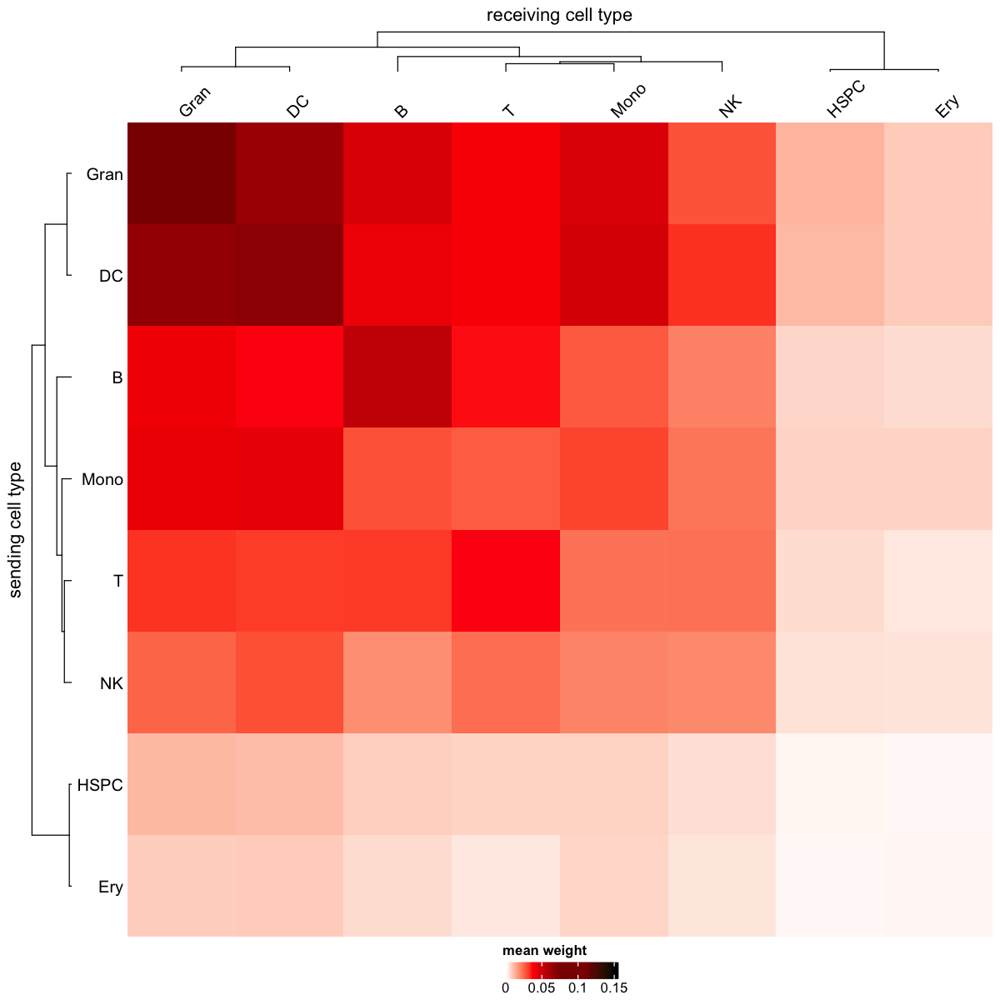

In [117]:
# heatmap of total weight of good interactions
lapply(c("AML","healthy")
      ,function(hs){
          
          idx_hs <- interactions$anno_samples$health_status == hs
          
          # number of interactions as heatmap
    df <- as.data.frame(matrix(,nrow = length(cell_types)
                              ,ncol = length(cell_types)
                              )
                       )
    rownames(df) <- cell_types
    colnames(df) <- cell_types

    # populate the data frame
    for(send in cell_types){
        idx_send <- interactions$anno_interactions$sending_cell_type == send

        for(rec in cell_types){
            idx_rec <- interactions$anno_interactions$receiving_cell_type == rec

            #print(send)
            #print(rec)
            #print(head(interactions$anno_interactions[idx_good & idx_send & idx_rec,c("interaction_ID"
            #                                                                          ,"log2FC_weights"
            #                                                                          , "sign")]))
            #print(sum(idx_good & idx_send & idx_rec))

            weights <- interactions$weights[idx_good & idx_send & idx_rec,idx_hs]
            #ifelse(length(weights) == 0
            #      ,df[send,rec] <- 0
                 # ,
            df[send,rec] <- mean(unlist(weights))
             #     )
            

        }
    }

    print(df)

    my_color <-  colorRamp2(seq(0
                                , 0.15 #max(df)
                                , length = 5)
                            , c("white", "red", "red4",  "darkred", "black"))

    h <- Heatmap(df
                 ,name = "mean weight"
                 ,heatmap_legend_param = list(direction = "horizontal")
                 ,column_names_side = "top"
                 ,row_names_side = "left"
                 ,col = my_color
                 ,column_title = "receiving cell type"
                 ,row_title = "sending cell type"
                 #,cluster_columns=FALSE
                 #,cluster_rows=FALSE
                 #,row_order = c("HSPC", "DC", "Mono", "Ery", "B", "T")
                 #,column_order = c("HSPC","DC", "Mono", "Ery", "B", "T")
                 ,column_names_rot = 45
                )
          ComplexHeatmap::draw(h
             ,heatmap_legend_side = "bottom")

    pdf(file=paste0("figures/heatmap_cellTypes_meanWeight_"
                    ,hs
                    ,".pdf"))
         ComplexHeatmap::draw(h
             ,heatmap_legend_side = "bottom")
           dev.off()
      })

### Volcano plot

We can now visualize the interactions with a volcano plot. 

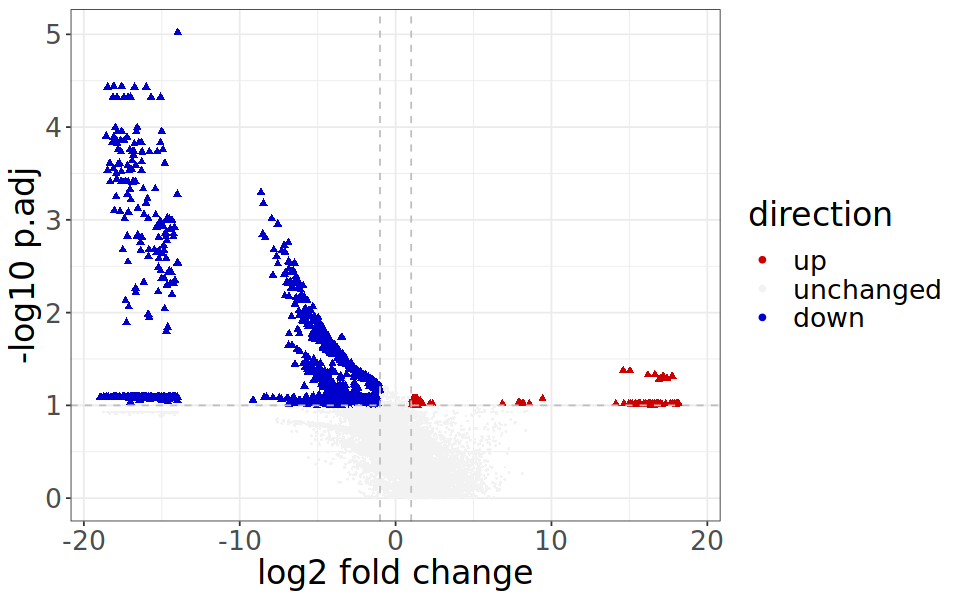

In [17]:
# volcano plot
options(repr.plot.height = 5
       ,repr.plot.width = 8)

df <- data.frame(log2FC = interactions$anno_interactions$log2FC_weights[idx_good]
                 ,y = -log10(interactions$anno_interactions$p.adj[idx_good])
                 ,significant = interactions$anno_interactions$sign[idx_good]
                )

df$direction <- "unchanged"
df$direction[df$significant & (df$log2FC > 1)] <- "up"
df$direction[df$significant & (df$log2FC < -1)] <- "down"
df$direction <- factor(df$direction
                      ,levels = c("up"
                                 ,"unchanged"
                                 ,"down")
                      ,ordered = TRUE)

xlab <- "log2 fold change"
ylab <- "-log10 p.adj"

xlim <- c(-max(abs(df$log2FC))
          ,max(abs(df$log2FC))
         )
ylim <- c(0, max(df$y))

p <- ggplot(data = df
            ,aes(x = log2FC
                 ,y = y
                 ,color = direction
                 ,size = significant
                 ,shape = significant
                ))+
geom_point()+
scale_color_manual(values = c("red3"
                               ,"gray95"
                               ,"blue3"))+
scale_size_manual(values = c(0.5, 1.5))+
guides(size = "none"
      ,shape = "none")+
xlab(xlab)+
ylab(ylab)+
xlim( xlim )+
ylim(ylim)+
theme_bw()+
theme(text = element_text(size=20))+
geom_vline(xintercept = interactions$thresholds$threshold_log2FC
          ,lty = 2
          ,color = "gray")+
geom_vline(xintercept = -interactions$thresholds$threshold_log2FC
          ,lty = 2
          ,color = "gray")+
geom_hline(yintercept = -log10(interactions$thresholds$threshold_fdr)
          ,lty = 2
          ,color = "gray")
p




  up unchanged down
1 92     16360 1742


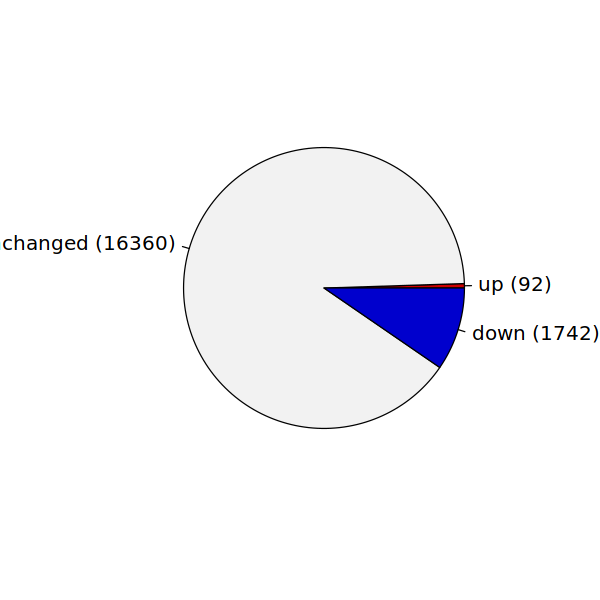

In [18]:
# pie chart
df <- data.frame(up = sum(idx_good & idx_sign & idx_up)
                ,unchanged = sum(idx_good & !idx_sign)
                , down = sum(idx_good & idx_sign & idx_down)
                )
print(df)

options(repr.plot.width = 5
       ,repr.plot.height = 5)
pie(unlist(df)
   ,labels = paste0(colnames(df)," (",unlist(df), ")")
   ,col = c("red3"
           ,"gray95"
           ,"blue3")) 

### Heatmap of top differential interactions

In [19]:
# heatmap of interactions weight of top differential interactions
# top adjusted p value
idx_topsign <- interactions$anno_interactions$p.adj %in% unique(sort(interactions$anno_interactions$p.adj))[1:500]
# all upregulated interactions
idx_topup <- interactions$anno_interactions$log2FC_weights > 1 & idx_topsign

# top 20 downregulated interactions
idx_topdown <- interactions$anno_interactions$log2FC_weights < -1 & idx_topsign
idx_topdown20 <- interactions$anno_interactions$interaction_ID %in% interactions$anno_interactions$interaction_ID[idx_topdown][1:20]

idx <- idx_topup | idx_topdown20
print(sum(idx))

[1] 29


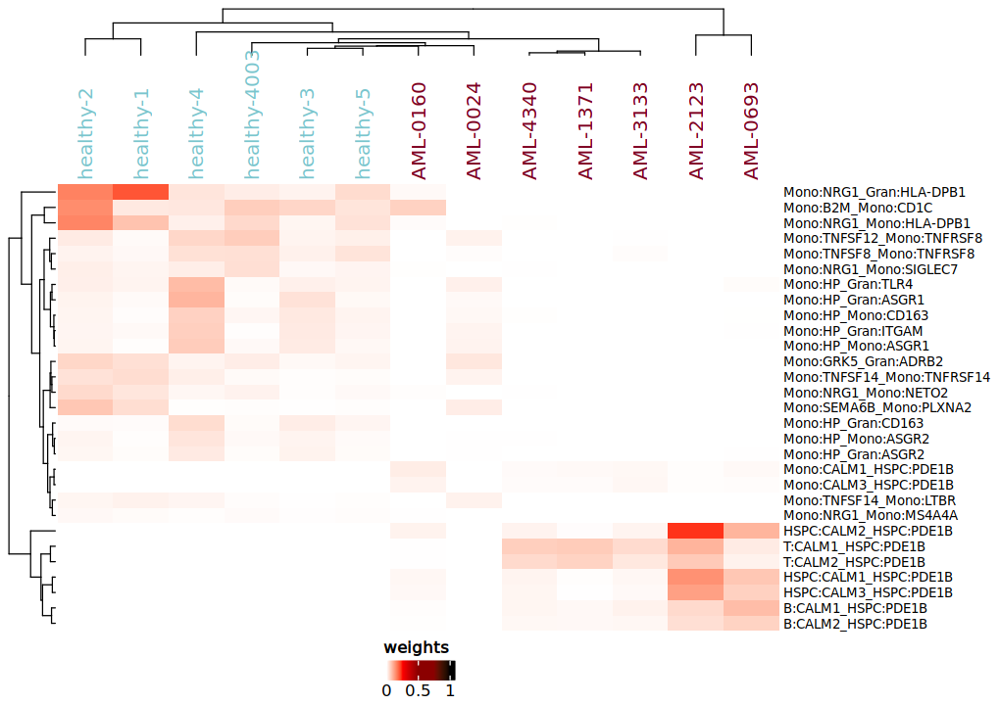

In [20]:
set.seed(1)
options(repr.plot.height = 6
       ,repr.plot.width = 8.5)
plot_heatmap(interactions
            ,which_interactions = idx
            ,values_to_plot = "weights")

#### Individual parameters

  cell_type  log2FC_rho
6      HSPC  2.17786184
7       Ery  1.68004637
3         T  0.16795948
4        NK  0.05044305
1      Mono -0.45469947
2      Gran -0.51086488
5         B -0.67813612
8        DC -1.37836811


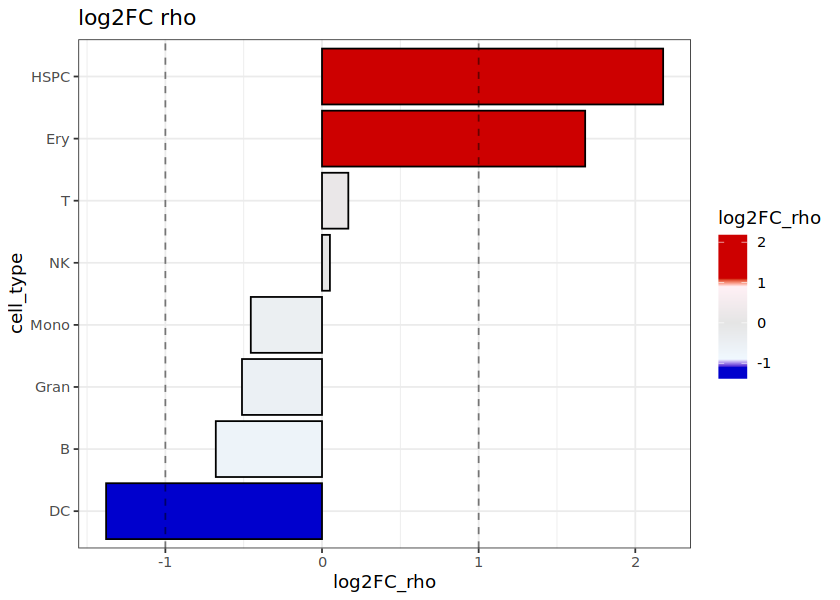

In [23]:
# plot log2FC rho for cell types
df <- data.frame(cell_type = cell_types)
df$log2FC_rho <- sapply(cell_types
                       ,function(ct){
                           idx_ct <- interactions$anno_interactions$sending_cell_type == ct # just take the sending
                         interactions$anno_interactions$log2FC_rho_s[idx_ct][1] # just take the first one
                       })
df <- df[order(df$log2FC_rho,decreasing = TRUE),]
df$cell_type <- factor(df$cell_type
                         ,levels = df$cell_type
                         ,ordered = TRUE)
print(df)

my_values <- c(min(df$log2FC_rho),-1.1,-0.9,0,0.9,1.1,max(df$log2FC_rho))
my_colors <- c("blue3","blue3","aliceblue","gray90","lavenderblush","red3","red3")
names(my_colors) <- my_values
resc_values <- rescale(as.numeric(names(my_colors)))

options(repr.plot.width = 7
       ,repr.plot.height = 5)
ggplot(data = df
      ,aes(x = cell_type
          ,y = log2FC_rho
          ,fill = log2FC_rho)
      )+
geom_col(color = "black")+
scale_fill_gradientn(colours = my_colors
                           ,values = resc_values
                          )+
geom_hline(yintercept = c(-1,1)
          ,lty = 2
          ,lwd = 0.5
          ,alpha = 0.5)+
ggtitle("log2FC rho")+
scale_x_discrete(limits = rev)+ # reverse order on the x axis
coord_flip()+
theme_bw()

'data.frame':	114770 obs. of  2 variables:
 $ cell_type: Ord.factor w/ 6 levels "HSPC"<"DC"<"Mono"<..: 3 3 3 3 3 3 3 3 3 3 ...
 $ log2FC   : Ord.factor w/ 3 levels "log2FC > 1"<"unchanged"<..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


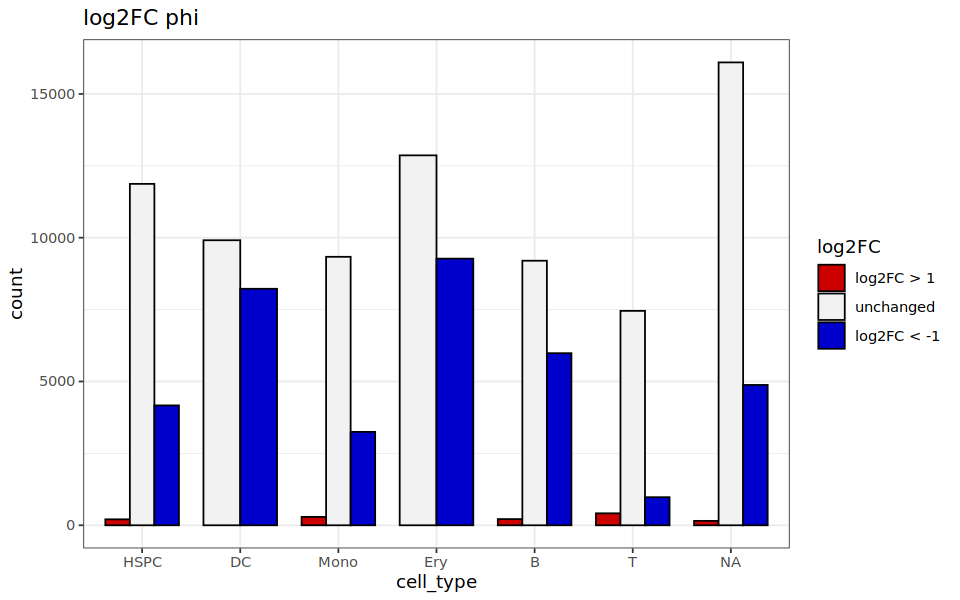

In [24]:
# phi log2FC by cell type
df <- lapply(c("up"
                    ,"unchanged"
                    ,"down")
                   ,function(dir){
                       if(dir == "up"){
                           idx_send <-interactions$anno_interactions$log2FC_phi_s_l > 1 & idx_good
                           idx_rec <- interactions$anno_interactions$log2FC_phi_r_r > 1 & idx_good
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       }else if(dir == "down"){
                           idx_send <-interactions$anno_interactions$log2FC_phi_s_l < -1 
                           idx_rec <- interactions$anno_interactions$log2FC_phi_r_r < -1
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       } else {
                           idx_send <- abs(interactions$anno_interactions$log2FC_phi_s_l) > 1 
                           idx_rec <- abs(interactions$anno_interactions$log2FC_phi_r_r) > 1
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       }
                       
                   }
                       )
df <- rbind(df[[1]],df[[2]],df[[3]])
df$cell_type <- factor(df$cell_type
                         ,levels = c("HSPC"
                                     ,"DC"
                                    ,"Mono"
                                    ,"Ery"
                                    ,"B"
                                    ,"T")
                         ,ordered = TRUE)
df$log2FC <- factor(df$log2FC
                      ,levels = c("up"
                                 ,"unchanged"
                                 ,"down")
                       ,labels = c("log2FC > 1"
                                  ,"unchanged"
                                  ,"log2FC < -1")
                      ,ordered = TRUE)
print(str(df))

           
options(repr.plot.width = 8
       ,repr.plot.height = 5)
p <- ggplot(data = df
          ,aes(x = cell_type
               ,fill = log2FC
              )
           )+
    geom_bar(position = "dodge"
            ,width=.75
            ,color = "black")+
scale_fill_manual(values = c("red3","gray95","blue3"))+
    ggtitle("log2FC phi")+
    #ylim(c(0,3500))+
    theme_bw()

p

'data.frame':	94897 obs. of  2 variables:
 $ cell_type: Ord.factor w/ 6 levels "HSPC"<"DC"<"Mono"<..: 1 1 1 1 1 1 1 1 1 1 ...
 $ log2FC   : Ord.factor w/ 3 levels "log2FC > 1"<"unchanged"<..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


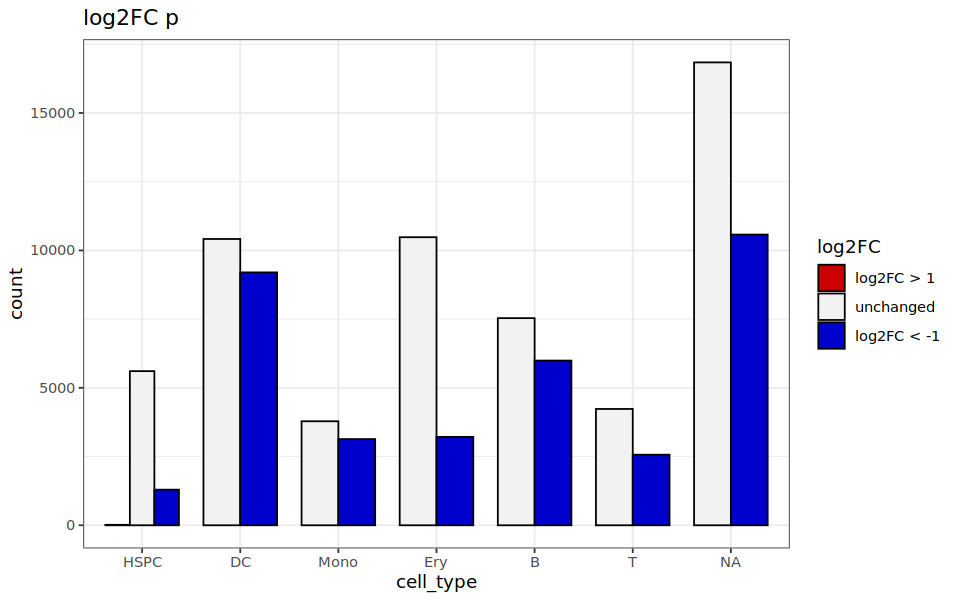

In [25]:
# phi log2FC by cell type
df <- lapply(c("up"
                    ,"unchanged"
                    ,"down")
                   ,function(dir){
                       if(dir == "up"){
                           idx_send <-interactions$anno_interactions$log2FC_p_s_l > 1 & idx_good
                           idx_rec <- interactions$anno_interactions$log2FC_p_r_r > 1 & idx_good
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       }else if(dir == "down"){
                           idx_send <-interactions$anno_interactions$log2FC_p_s_l < -1 
                           idx_rec <- interactions$anno_interactions$log2FC_p_r_r < -1
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       } else {
                           idx_send <- abs(interactions$anno_interactions$log2FC_p_s_l) > 1 
                           idx_rec <- abs(interactions$anno_interactions$log2FC_p_r_r) > 1
                           my_df <- data.frame(cell_type = c(interactions$anno_interactions$sending_cell_type[idx_send]
                                                             ,interactions$anno_interactions$receiving_cell_type[idx_rec])
                                               ,log2FC = rep(dir,sum(idx_send) + sum(idx_rec))
                                              )
                           my_df
                       }
                       
                   }
                       )
df <- rbind(df[[1]],df[[2]],df[[3]])
df$cell_type <- factor(df$cell_type
                         ,levels = c("HSPC"
                                     ,"DC"
                                    ,"Mono"
                                    ,"Ery"
                                    ,"B"
                                    ,"T")
                         ,ordered = TRUE)
df$log2FC <- factor(df$log2FC
                      ,levels = c("up"
                                 ,"unchanged"
                                 ,"down")
                    ,labels = c("log2FC > 1"
                               ,"unchanged"
                               ,"log2FC < -1")
                      ,ordered = TRUE)
print(str(df))

           
options(repr.plot.width = 8
       ,repr.plot.height = 5)
p <- ggplot(data = df
          ,aes(x = cell_type
               ,fill = log2FC
              )
           )+
    geom_bar(position = "dodge"
            ,width=.75
            ,color = "black")+
scale_fill_manual(values = c("red3","gray95","blue3"))+
    ggtitle("log2FC p")+
    #ylim(c(0,3500))+
    theme_bw()

p

### Classes of interactions

In this section, we will check which of the individual components (rho, phi, p) are driving the change of the interactions. For this, we will combine following forest plots: 
- log2 fold change of the interaction weight (`w`)
- log2 fold change of the cell type abundance of the sending cell type (`rho_s`)
- log2 fold change of the active fraction of the sending cell type expressing the ligand (`phi_s_l`)
- log2 fold change of the expression of the sending cell type expressing the ligand (`p_s_l`)
- log2 fold change of the cell type abundance of the receiving cell type (`rho_r`)
- log2 fold change of the active fraction of the receiving cell type expressing the receptor (`phi_r_r`)
- log2 fold change of the expression of the receiving cell type expressing the receptor (`p_r_r`)

We will first explore the interaction that were unchanged. We will start with the interactions that had a trully unchanged log2 fold change of the weight (i.e. -1 < `log2FC_weight` < 1), and then plot the interactions with eigther up- or down-regulated log2 fold change of the weight, which though didn't pass the adjusted p-value threshold.

#### Unchanged

In [26]:
idx_of_interest <- !idx_sign & idx_good
sum(idx_of_interest)

[1] 16360

 No log2FC of the w.

In [27]:
idx_w <- abs(interactions$anno_interactions$log2FC_weights) < 1
sum(idx_of_interest & idx_w)

[1] 6498

[1] "rho"  "none" "phi"  "none" "p"    "none"
[1] "2746 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "none"
[1] "1235 interactions"
[1] "rho"  "both" "phi"  "none" "p"    "none"
[1] "237 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "none"
[1] "585 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "none"
[1] "16 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "one" 
[1] "37 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "one" 
[1] "21 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "one" 
[1] "2 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "one" 
[1] "28 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "one"  "p"    "none"
[1] "1239 interactions"
[1] "rho" "one" "phi" "one" "p"   "one"
[1] "

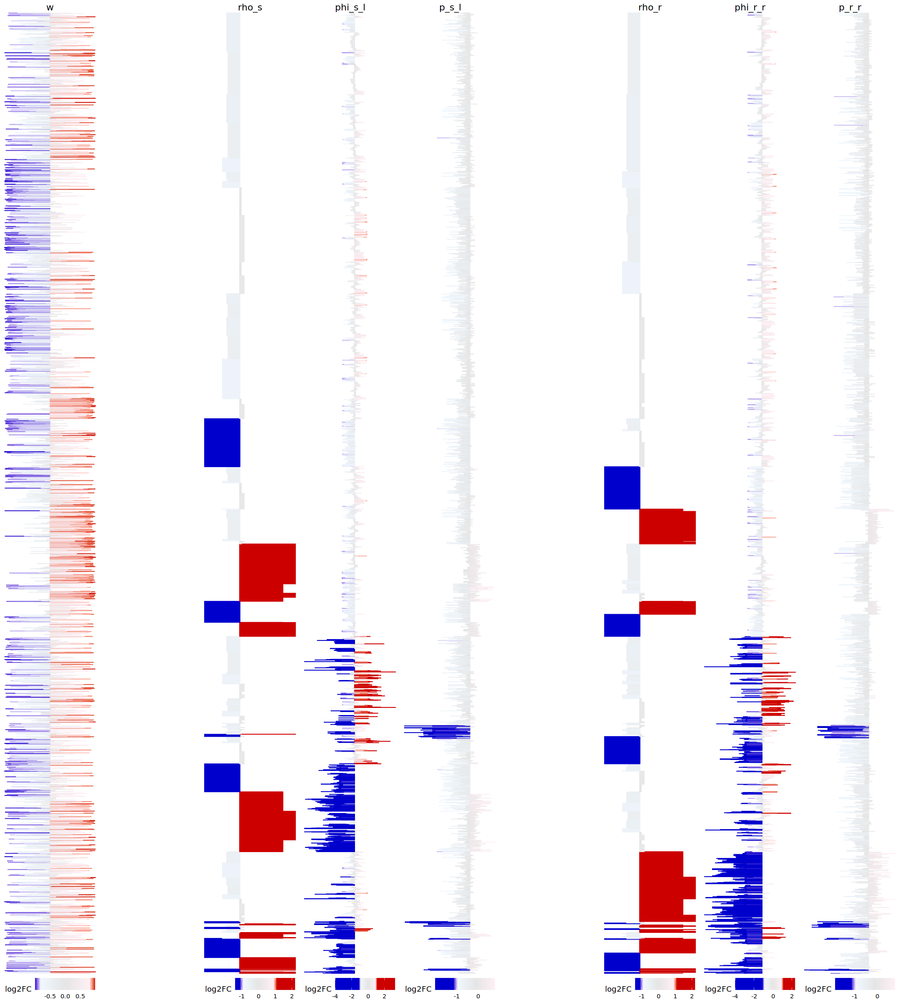

In [20]:
options(repr.plot.height = 20
       ,repr.plot.width = 18)
plot_all_forests(idx_of_interest & idx_w
                ,my_anno_interactions = interactions$anno_interactions)

<span style="color:red">**ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!**</span>

ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!

Log2FC of w > 1, but is not significant.

In [28]:
idx_w <- interactions$anno_interactions$log2FC_weights > 1
sum(idx_of_interest & idx_w)

[1] 4770

[1] "rho"  "none" "phi"  "none" "p"    "none"
[1] "1017 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "none"
[1] "1655 interactions"
[1] "rho"  "both" "phi"  "none" "p"    "none"
[1] "286 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "none"
[1] "353 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "none"
[1] "22 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "one" 
[1] "39 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "one" 
[1] "3 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "one" 
[1] "2 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "one" 
[1] "18 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "one"  "p"    "none"
[1] "669 interactions"
[1] "rho" "one" "phi" "one" "p"   "one"
[1] "7 

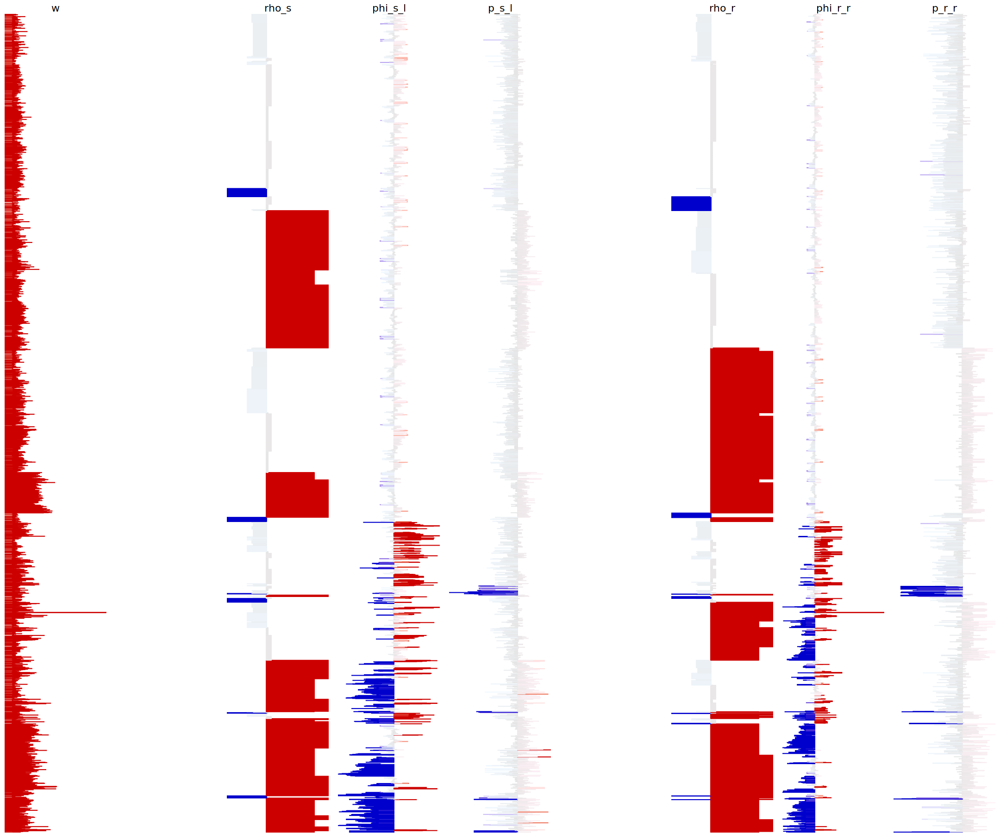

In [29]:
options(repr.plot.height = 15
       ,repr.plot.width = 18)
plot_all_forests(idx_of_interest & idx_w
                ,my_anno_interactions = interactions$anno_interactions, plot_legend=FALSE)

<span style="color:red">**ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!**</span>

ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!

Log2FC of w < -1, but is not significant.

In [30]:
idx_w <- interactions$anno_interactions$log2FC_weights < -1
sum(idx_of_interest & idx_w)

[1] 5092

[1] "rho"  "none" "phi"  "none" "p"    "none"
[1] "1983 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "none"
[1] "845 interactions"
[1] "rho"  "both" "phi"  "none" "p"    "none"
[1] "69 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "none"
[1] "617 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "none"
[1] "30 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "one" 
[1] "32 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "one" 
[1] "28 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "one" 
[1] "3 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "one" 
[1] "9 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "one"  "p"    "none"
[1] "908 interactions"
[1] "rho" "one" "phi" "one" "p"   "one"
[1] "154 

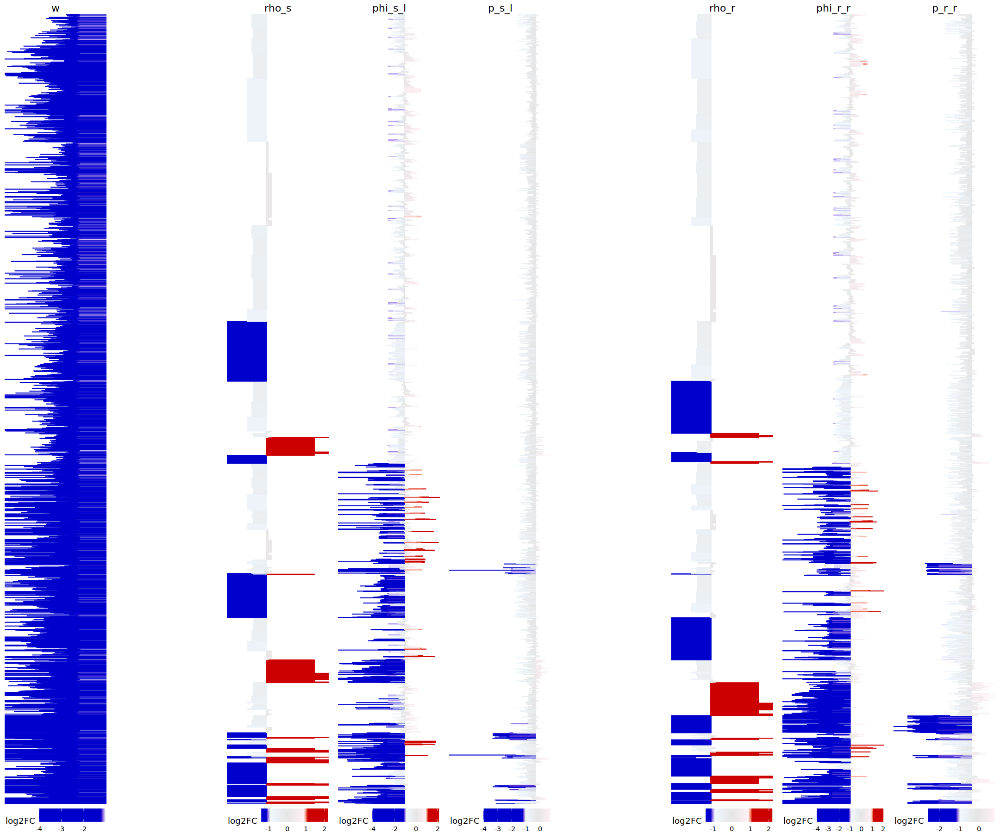

In [31]:
options(repr.plot.height = 15
       ,repr.plot.width = 18)
plot_all_forests(idx_of_interest & idx_w
                ,my_anno_interactions = interactions$anno_interactions)

<span style="color:red">**ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!**</span>


ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!

#### Up-regulated

Now we will explore the interactions in which the `log2FC_weights` passed the upper log2 fold change threshodl, but didn't pass the adjusted p-value threshold.

In [32]:
idx_of_interest <- idx_good & idx_sign & idx_up
sum(idx_of_interest)

[1] 92

[1] "rho"  "none" "phi"  "none" "p"    "none"
[1] "1 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "none"
[1] "6 interactions"
[1] "rho"  "both" "phi"  "none" "p"    "none"
[1] "1 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "none"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "none"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "one" 
[1] "0 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "one" 
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "one" 
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "one" 
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "one"  "p"    "none"
[1] "38 interactions"
[1] "rho" "one" "phi" "one" "p"   "one"
[1] "13 interactions"

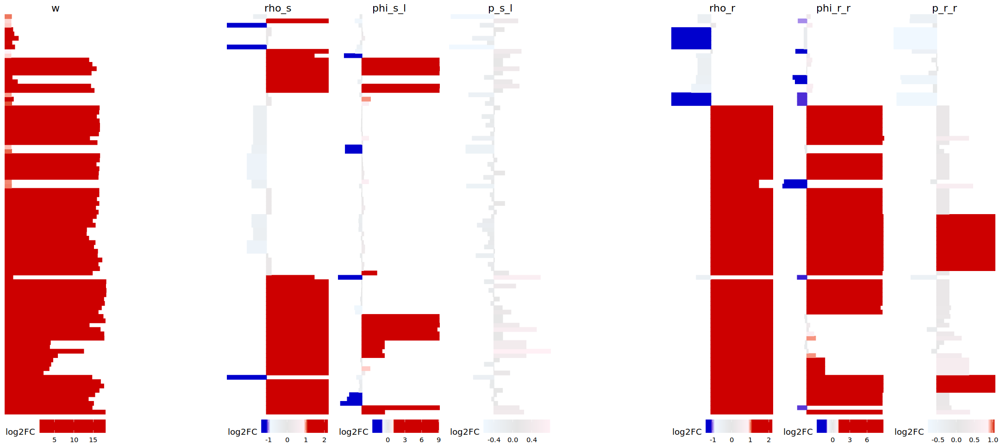

In [33]:
options(repr.plot.height = 8
       ,repr.plot.width = 18)
plot_all_forests(idx_of_interest
                ,my_anno_interactions = interactions$anno_interactions)

<span style="color:red">**ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!**</span>


ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!

#### Down-regulated

Here we will explore the interactions in which the `log2FC_weights` passed the lower log2 fold change threshodl, but didn't pass the adjusted p-value threshold.

In [34]:
idx_of_interest <- idx_good & idx_sign & idx_down
sum(idx_of_interest)

[1] 1742

[1] "rho"  "none" "phi"  "none" "p"    "none"
[1] "179 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "none"
[1] "89 interactions"
[1] "rho"  "both" "phi"  "none" "p"    "none"
[1] "19 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "none"
[1] "258 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "none"
[1] "23 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "one" 
[1] "1 interactions"
[1] "rho"  "none" "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "one" 
[1] "25 interactions"
[1] "rho"  "none" "phi"  "one"  "p"    "both"
[1] "0 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "one" 
[1] "6 interactions"
[1] "rho"  "none" "phi"  "both" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "one" 
[1] "4 interactions"
[1] "rho"  "one"  "phi"  "none" "p"    "both"
[1] "0 interactions"
[1] "rho"  "one"  "phi"  "one"  "p"    "none"
[1] "569 interactions"
[1] "rho" "one" "phi" "one" "p"   "one"
[1] "114 int

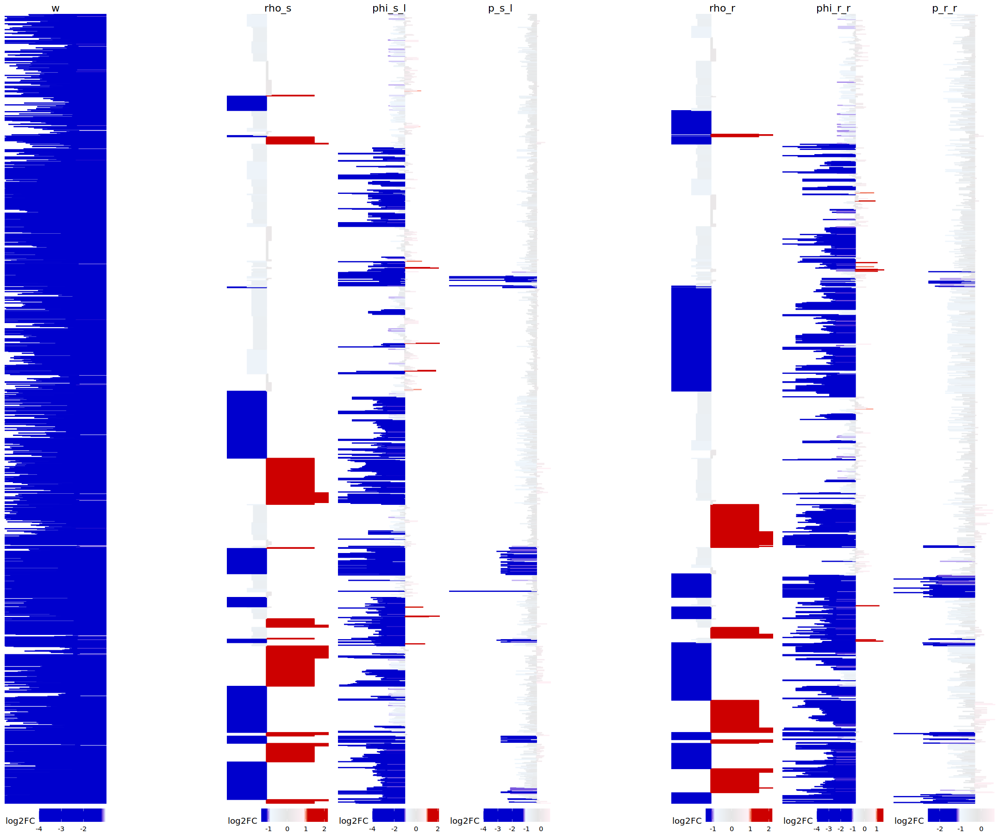

In [35]:
options(repr.plot.height = 15
       ,repr.plot.width = 18)
plot_all_forests(idx_of_interest
                ,my_anno_interactions = interactions$anno_interactions)

<span style="color:red">**ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!**</span>


ADD EXPLANATION OF WHAT WE SEE!!!!!!!!!!!!

### Heatmap number of differential interactions

[1] "Mono"
[1] "Mono"
              interaction_ID log2FC_weights sign
29        Mono:CD48_Mono:CD2      -2.042923 TRUE
101 Mono:TNFSF8_Mono:TNFRSF8      -4.559338 TRUE
250       Mono:B2M_Mono:CD1C      -2.827132 TRUE
461       Mono:CD58_Mono:CD2      -1.440903 TRUE
823    Mono:HLA-DOA_Mono:CD4      -1.184697 TRUE
878       Mono:HP_Mono:ASGR1      -3.202892 TRUE
[1] 20
[1] "Mono"
[1] "Gran"
           interaction_ID log2FC_weights sign
2163 Mono:CALM1_Gran:HMMR      -3.253792 TRUE
2604 Mono:GRK5_Gran:ADRB2      -2.495163 TRUE
2708   Mono:HP_Gran:ASGR1      -4.613362 TRUE
2709   Mono:HP_Gran:ASGR2      -5.415617 TRUE
2710   Mono:HP_Gran:CD163     -16.009731 TRUE
2712   Mono:HP_Gran:ITGAM      -3.225077 TRUE
[1] 17
[1] "Mono"
[1] "T"
         interaction_ID log2FC_weights sign
3682  Mono:CD244_T:CD48      -2.244121 TRUE
3689    Mono:CD48_T:CD2      -2.330808 TRUE
3708 Mono:EFNA4_T:EPHA4     -14.891758 TRUE
3743   Mono:PVR_T:TIGIT      -5.098629 TRUE
3769   Mono:PVR_T:CD226     -17.172321

Warning message:
"The input is a data frame-like object, convert it to a matrix."


[1] "Mono"
[1] "Mono"
           interaction_ID log2FC_weights sign
1365 Mono:POMC_Mono:GPR84       1.152092 TRUE
[1] 1
[1] "Mono"
[1] "Gran"
[1] interaction_ID log2FC_weights sign          
<0 rows> (or 0-length row.names)
[1] 0
[1] "Mono"
[1] "T"
[1] interaction_ID log2FC_weights sign          
<0 rows> (or 0-length row.names)
[1] 0
[1] "Mono"
[1] "NK"
[1] interaction_ID log2FC_weights sign          
<0 rows> (or 0-length row.names)
[1] 0
[1] "Mono"
[1] "B"
[1] interaction_ID log2FC_weights sign          
<0 rows> (or 0-length row.names)
[1] 0
[1] "Mono"
[1] "HSPC"
              interaction_ID log2FC_weights sign
9489   Mono:CALM1_HSPC:PDE1B       15.03711 TRUE
9500   Mono:CALM2_HSPC:PDE1B       14.64876 TRUE
9510   Mono:CALM3_HSPC:PDE1B       14.60462 TRUE
10026   Mono:HMGB1_HSPC:TLR4       16.80705 TRUE
10048 Mono:HSP90B1_HSPC:TLR4       16.54663 TRUE
10066  Mono:ICAM1_HSPC:ITGAX       15.19830 TRUE
[1] 12
[1] "Mono"
[1] "Ery"
[1] interaction_ID log2FC_weights sign          
<0 row

Warning message:
"The input is a data frame-like object, convert it to a matrix."


[[1]]
png 
  2 

[[2]]
png 
  2

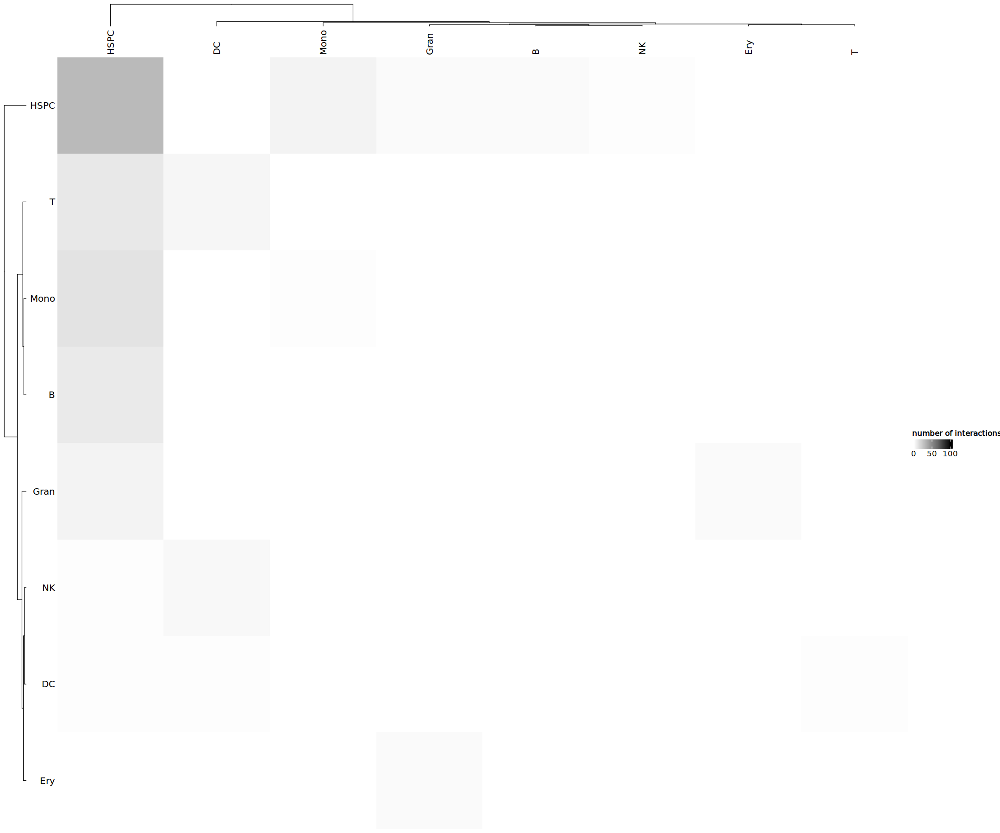

In [40]:
# mean number of interactions as heatmap
lapply(c("down"
         ,"up"
         #,"unchanged"
        )
       ,function(dir){
           # subset interactions
    ifelse(dir == "up"
              ,idx <- idx_good & idx_sign & idx_up
              ,ifelse(dir == "down"
                      ,idx <- idx_good & idx_sign & idx_down
                      ,idx <- !idx_sign & idx_good
                     )
              )
    
    # create a dummy data frame
    df <- as.data.frame(matrix(,nrow = length(cell_types)
                              ,ncol = length(cell_types)
                              )
                       )
    rownames(df) <- cell_types
    colnames(df) <- cell_types
    
    # populate the data frame
    for(send in cell_types){
        idx_send <- interactions$anno_interactions$sending_cell_type == send
        
        for(rec in cell_types){
            idx_rec <- interactions$anno_interactions$receiving_cell_type == rec
            
            print(send)
            print(rec)
            print(head(interactions$anno_interactions[idx & idx_send & idx_rec,c("interaction_ID","log2FC_weights", "sign")]))
            print(sum(idx & idx_send & idx_rec))
            
            df[send,rec] <- sum(idx & idx_send & idx_rec)
            
        }
    }
    
    print(df)
           
    my_color <-  colorRamp2(seq(0
                                ,100 #300
                                , length = 4)
                            , c("white","gray70","gray40","black"))
    
    h <- Heatmap(df
                 ,name = "number of interactions"
                 ,heatmap_legend_param = list(direction = "horizontal")
                 ,column_names_side = "top"
                 ,row_names_side = "left"
                 ,col = my_color
                )
           print(h
             #,heatmap_legend_side = "bottom"
                )
           
    pdf(file=paste0("figures/heatmap_cellTypes_number_"
                   ,dir
                   ,".pdf"))
          print(h
             #,heatmap_legend_side = "bottom"
               )
           dev.off()
    
       }
       )

### GO

[1] "Mono"
[1] "up"
 'table' int [1:19(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:19] "ANXA2" "CALM1" "CALM2" "CALM3" ...
NULL


'select()' returned 1:1 mapping between keys and columns



 'table' int [1:19(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:19] "ANXA2" "CALM1" "CALM2" "CALM3" ...
NULL
'data.frame':	19 obs. of  2 variables:
 $ SYMBOL  : chr  "ANXA2" "CALM1" "CALM2" "CALM3" ...
 $ ENTREZID: chr  "302" "801" "805" "808" ...
NULL
[1] "Mono"
[1] "down"
 'table' int [1:245(1d)] 22 18 16 15 14 14 13 11 11 9 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:245] "CD2" "EPOR" "HP" "THBS1" ...
NULL


'select()' returned 1:1 mapping between keys and columns



 'table' int [1:245(1d)] 22 18 16 15 14 14 13 11 11 9 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:245] "CD2" "EPOR" "HP" "THBS1" ...
NULL
'data.frame':	100 obs. of  2 variables:
 $ SYMBOL  : chr  "CD2" "EPOR" "HP" "THBS1" ...
 $ ENTREZID: chr  "914" "2057" "3240" "7057" ...
NULL
[1] "Gran"
[1] "up"
 'table' int [1:10(1d)] 2 1 1 1 1 1 1 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:10] "F13A1" "ADAM17" "CALM1" "CALM2" ...
NULL


'select()' returned 1:1 mapping between keys and columns



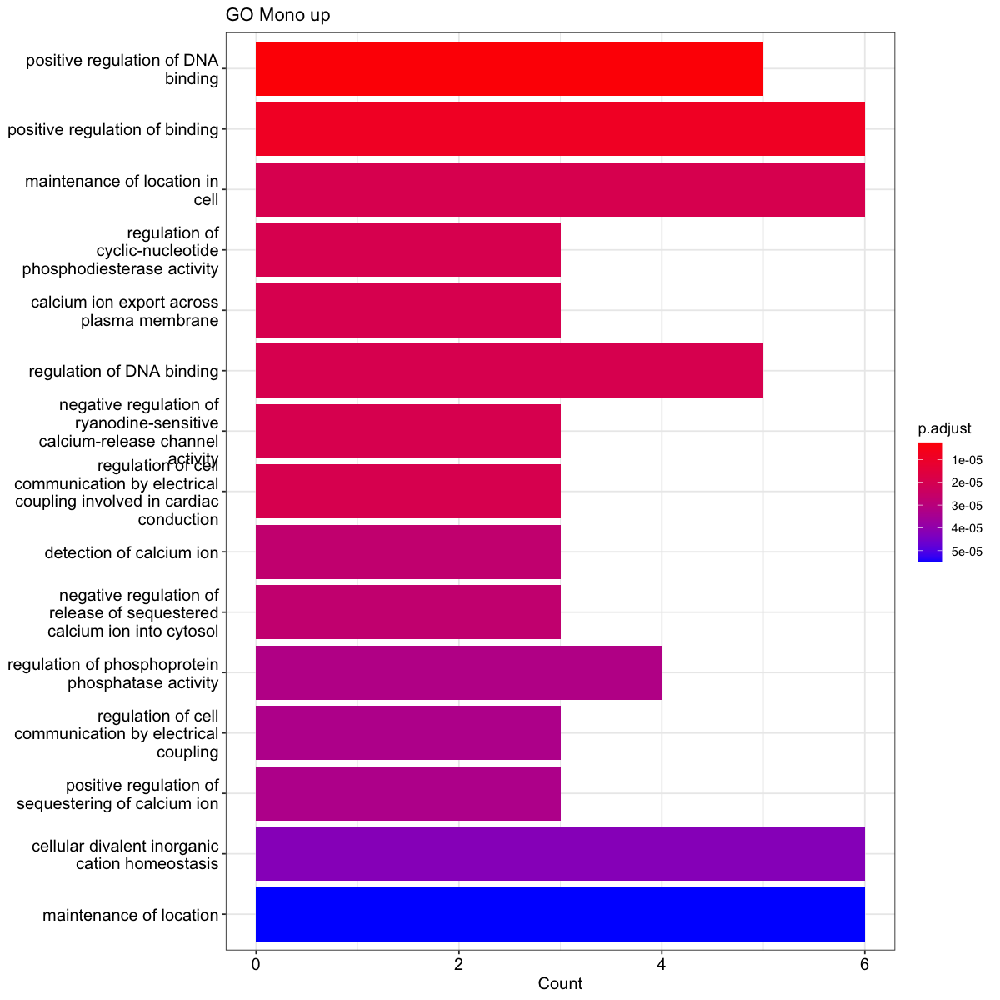

 'table' int [1:10(1d)] 2 1 1 1 1 1 1 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:10] "F13A1" "ADAM17" "CALM1" "CALM2" ...
NULL
'data.frame':	10 obs. of  2 variables:
 $ SYMBOL  : chr  "F13A1" "ADAM17" "CALM1" "CALM2" ...
 $ ENTREZID: chr  "2162" "6868" "801" "805" ...
NULL
[1] "Gran"
[1] "down"
 'table' int [1:177(1d)] 39 22 21 21 17 15 14 12 11 10 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:177] "THBS1" "LRP1" "ADRB2" "CD14" ...
NULL


'select()' returned 1:1 mapping between keys and columns



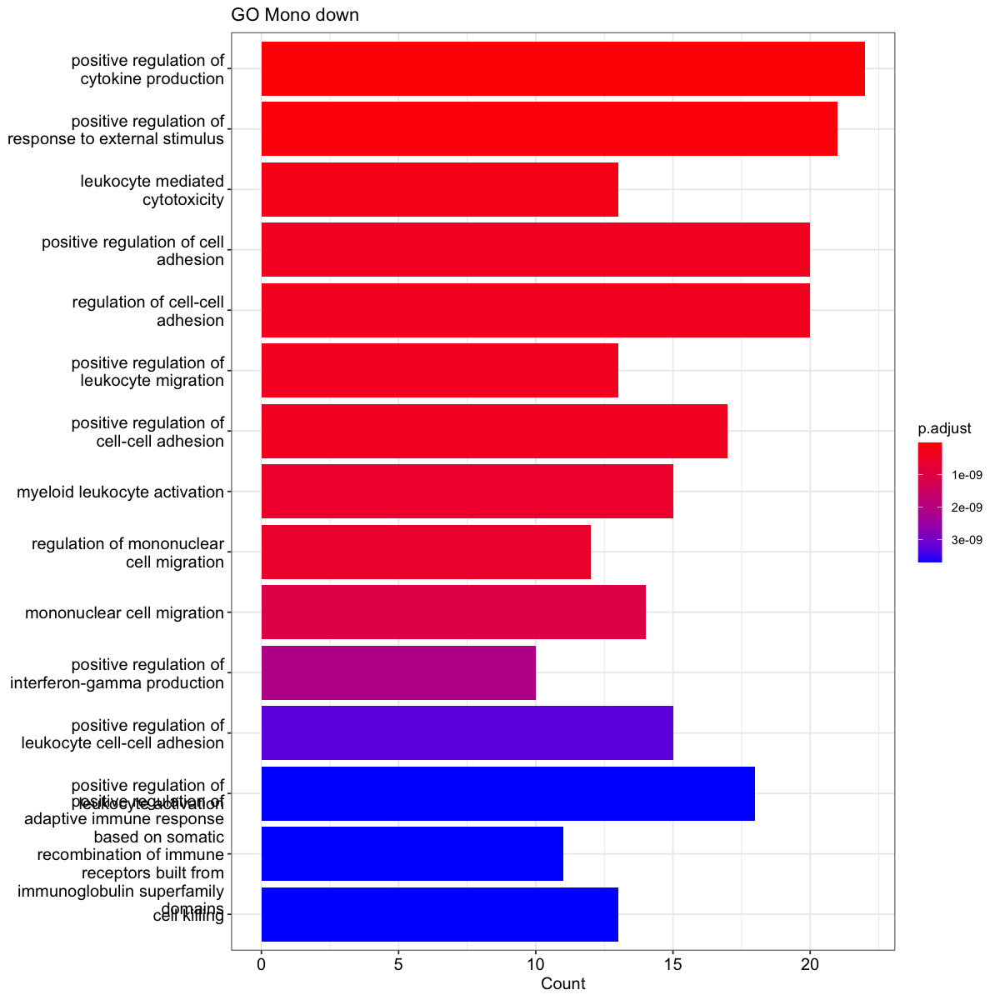

 'table' int [1:177(1d)] 39 22 21 21 17 15 14 12 11 10 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:177] "THBS1" "LRP1" "ADRB2" "CD14" ...
NULL
'data.frame':	100 obs. of  2 variables:
 $ SYMBOL  : chr  "THBS1" "LRP1" "ADRB2" "CD14" ...
 $ ENTREZID: chr  "7057" "4035" "154" "929" ...
NULL
[1] "T"
[1] "up"
 'table' int [1:15(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:15] "CALM1" "CALM2" "CALM3" "CD52" ...
NULL


'select()' returned 1:1 mapping between keys and columns



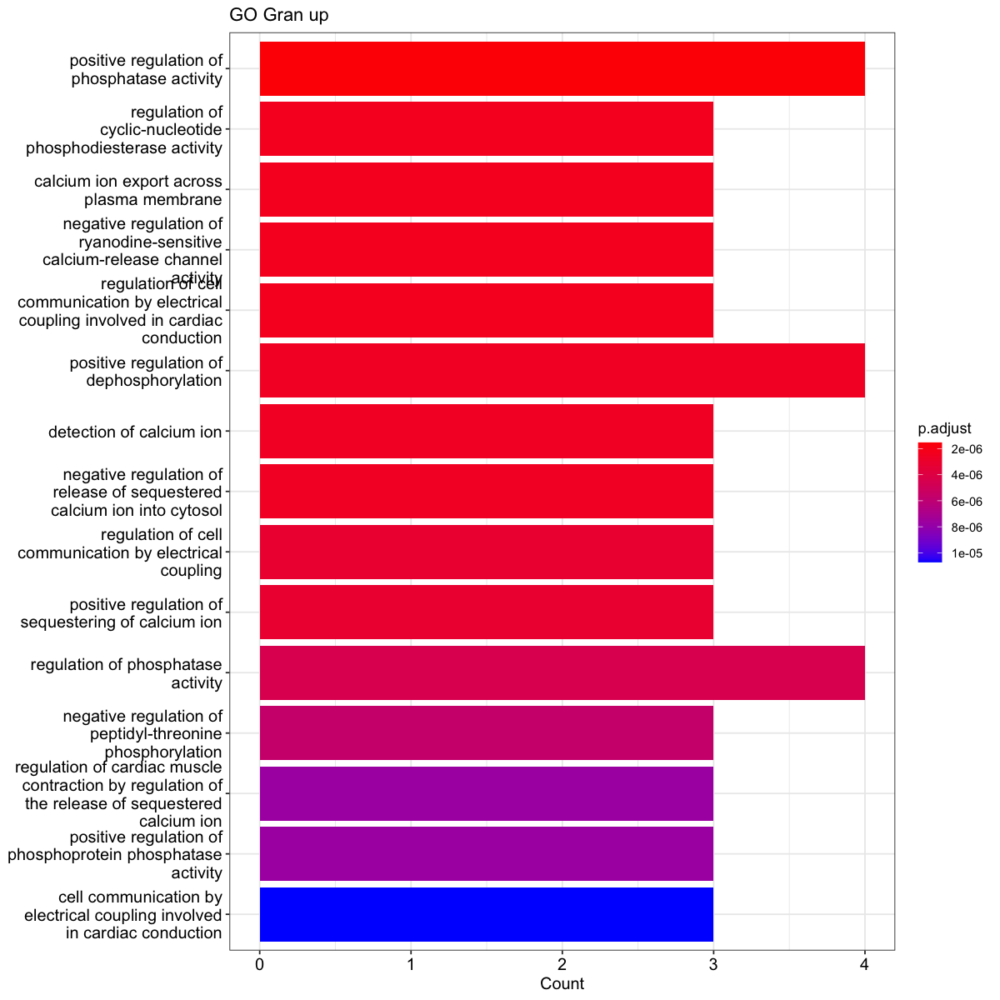

 'table' int [1:15(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:15] "CALM1" "CALM2" "CALM3" "CD52" ...
NULL
'data.frame':	15 obs. of  2 variables:
 $ SYMBOL  : chr  "CALM1" "CALM2" "CALM3" "CD52" ...
 $ ENTREZID: chr  "801" "805" "808" "1043" ...
NULL
[1] "T"
[1] "down"
 'table' int [1:116(1d)] 9 8 7 5 4 4 4 4 4 3 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:116] "ITGB1" "CD36" "ITGA4" "GNAI2" ...
NULL


'select()' returned 1:1 mapping between keys and columns



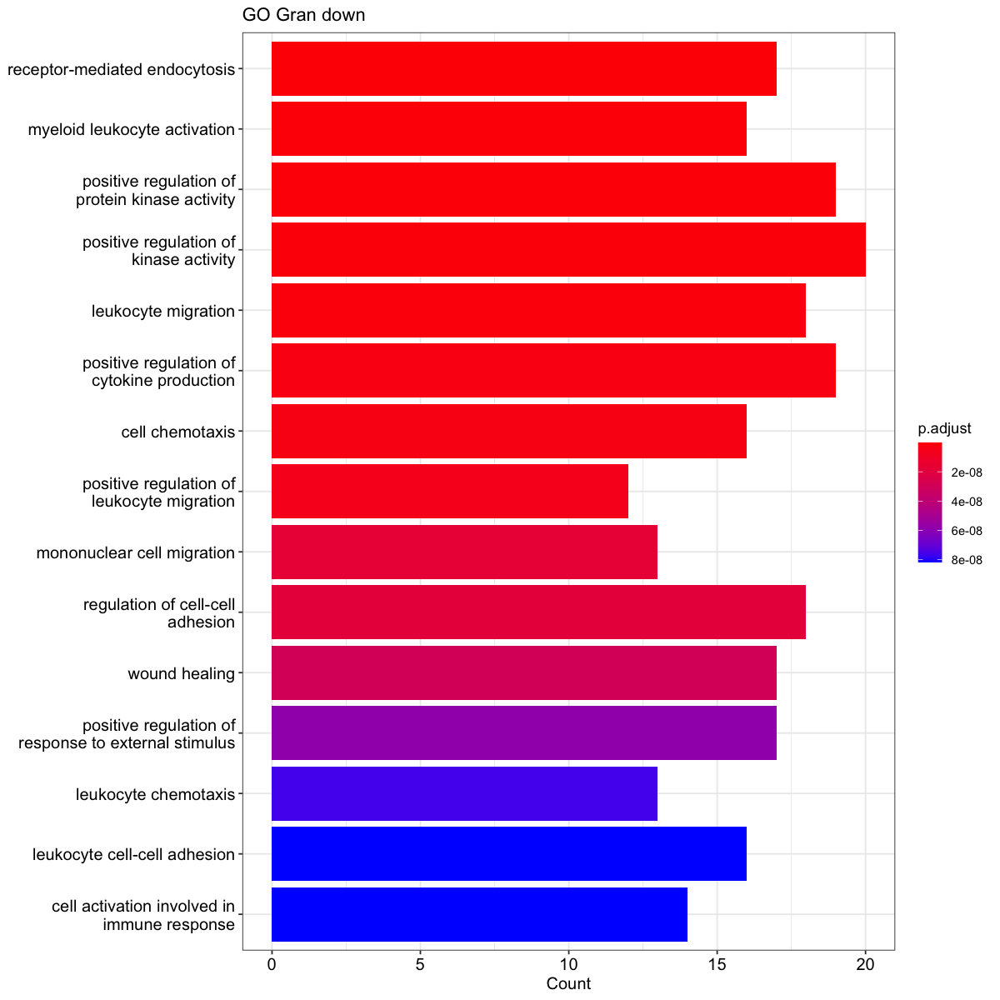

 'table' int [1:116(1d)] 9 8 7 5 4 4 4 4 4 3 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:116] "ITGB1" "CD36" "ITGA4" "GNAI2" ...
NULL
'data.frame':	99 obs. of  2 variables:
 $ SYMBOL  : chr  "ITGB1" "CD36" "ITGA4" "GNAI2" ...
 $ ENTREZID: chr  "3688" "948" "3676" "2771" ...
NULL
[1] "NK"
[1] "up"
 'table' int [1:5(1d)] 1 1 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:5] "CALM1" "CD52" "COPA" "HLA-B" ...
NULL


'select()' returned 1:1 mapping between keys and columns



 'table' int [1:5(1d)] 1 1 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:5] "CALM1" "CD52" "COPA" "HLA-B" ...
NULL
'data.frame':	5 obs. of  2 variables:
 $ SYMBOL  : chr  "CALM1" "CD52" "COPA" "HLA-B" ...
 $ ENTREZID: chr  "801" "1043" "1314" "3106" ...
NULL
[1] "NK"
[1] "down"
 'table' int [1:99(1d)] 15 9 7 6 6 5 5 5 5 5 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:99] "ITGB1" "SELL" "ITGA4" "ADAM10" ...
NULL


'select()' returned 1:1 mapping between keys and columns



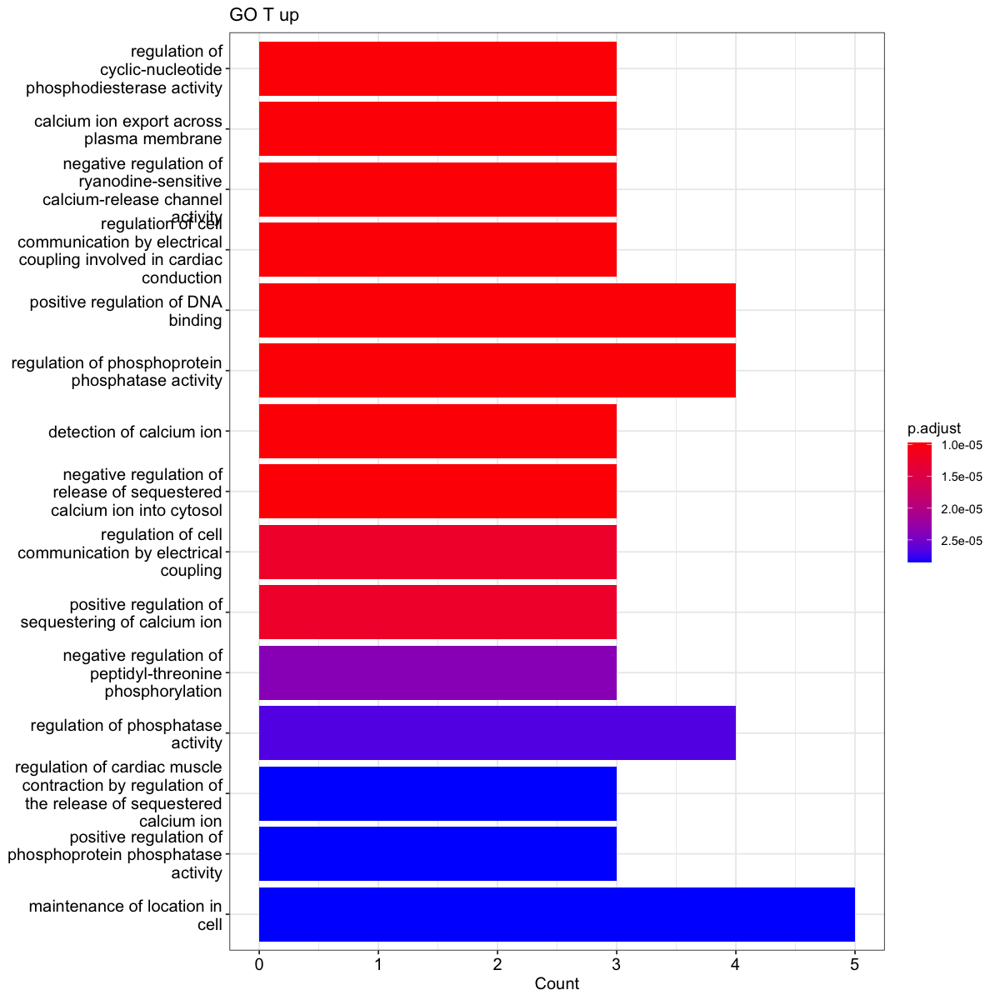

 'table' int [1:99(1d)] 15 9 7 6 6 5 5 5 5 5 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:99] "ITGB1" "SELL" "ITGA4" "ADAM10" ...
NULL
'data.frame':	98 obs. of  2 variables:
 $ SYMBOL  : chr  "ITGB1" "SELL" "ITGA4" "ADAM10" ...
 $ ENTREZID: chr  "3688" "6402" "3676" "102" ...
NULL
[1] "B"
[1] "up"
 'table' int [1:11(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:11] "ANXA2" "CALM1" "CALM2" "CALM3" ...
NULL


'select()' returned 1:1 mapping between keys and columns



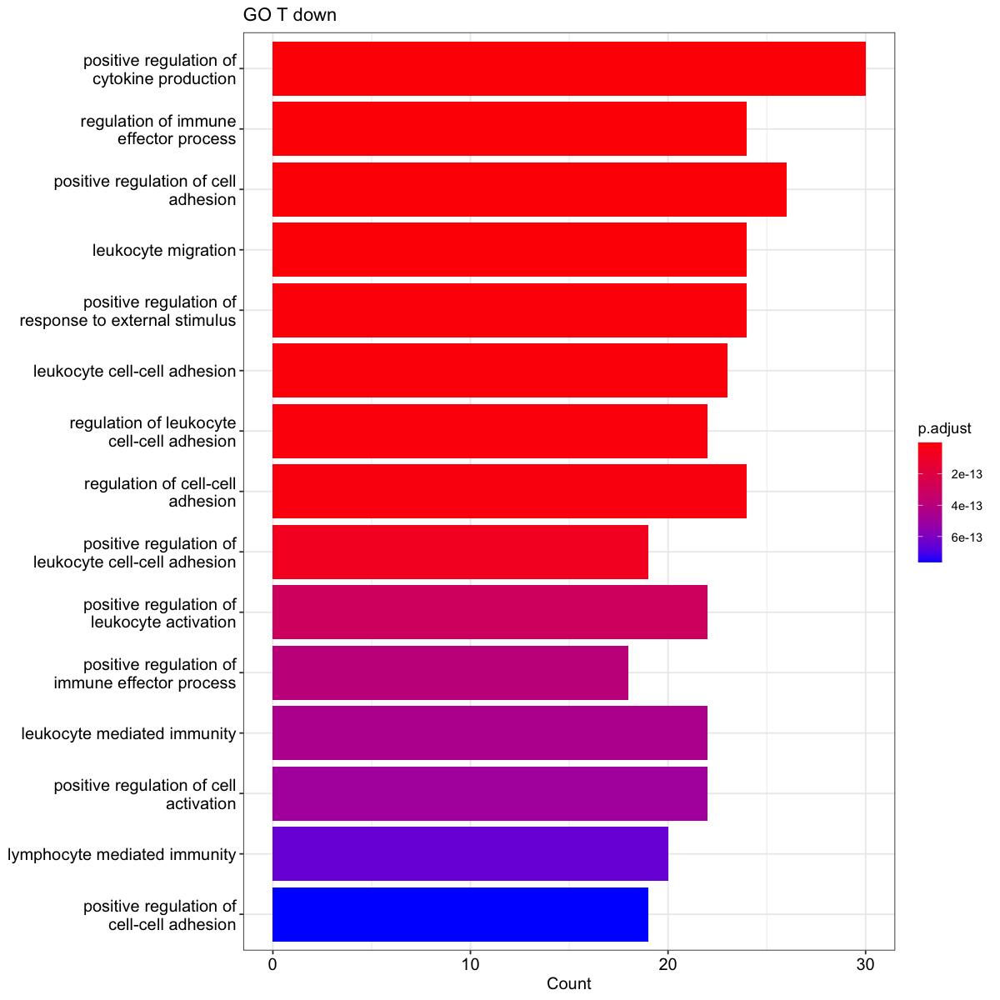

 'table' int [1:11(1d)] 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:11] "ANXA2" "CALM1" "CALM2" "CALM3" ...
NULL
'data.frame':	11 obs. of  2 variables:
 $ SYMBOL  : chr  "ANXA2" "CALM1" "CALM2" "CALM3" ...
 $ ENTREZID: chr  "302" "801" "805" "808" ...
NULL
[1] "B"
[1] "down"
 'table' int [1:108(1d)] 25 11 10 9 9 7 7 6 6 5 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:108] "CD9" "ITGA4" "TNFSF10" "CD320" ...
NULL


'select()' returned 1:1 mapping between keys and columns



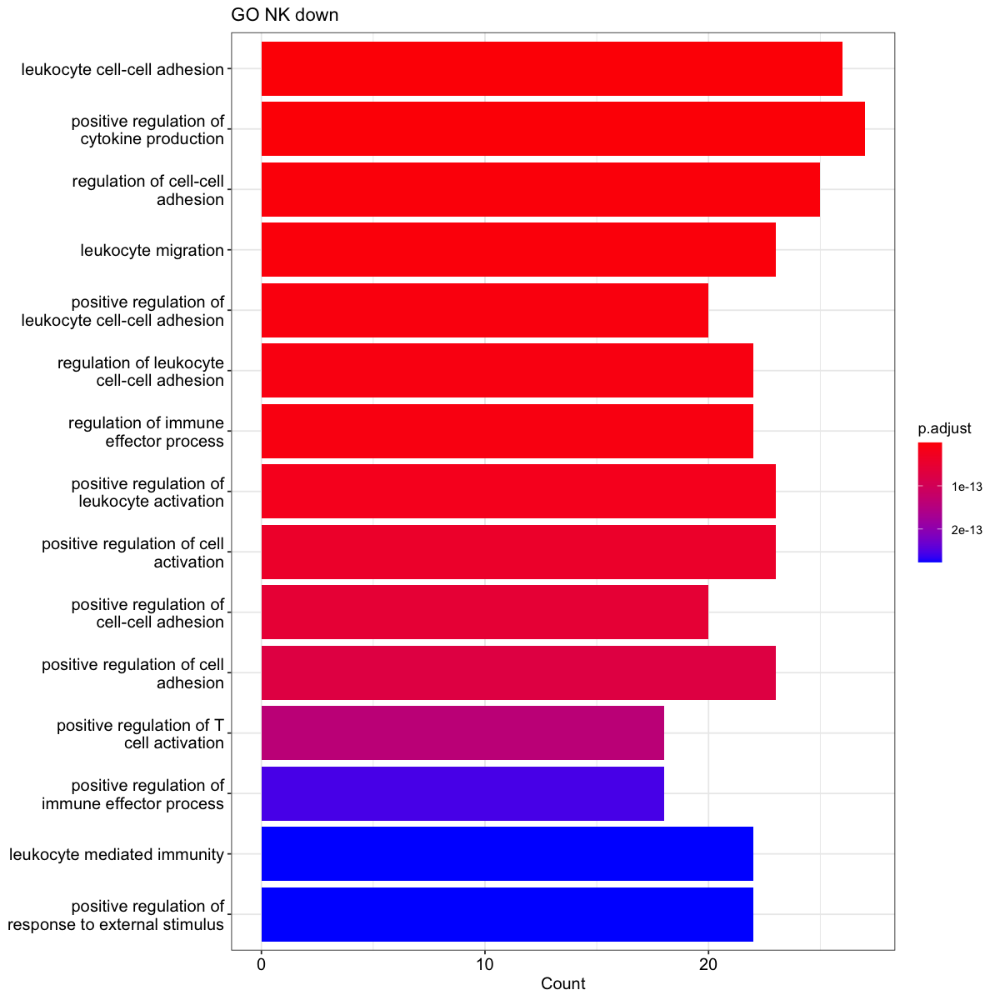

 'table' int [1:108(1d)] 25 11 10 9 9 7 7 6 6 5 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:108] "CD9" "ITGA4" "TNFSF10" "CD320" ...
NULL
'data.frame':	100 obs. of  2 variables:
 $ SYMBOL  : chr  "CD9" "ITGA4" "TNFSF10" "CD320" ...
 $ ENTREZID: chr  "928" "3676" "8743" "51293" ...
NULL
[1] "HSPC"
[1] "up"
 'table' int [1:38(1d)] 31 17 8 4 4 3 3 3 2 2 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:38] "TLR4" "PDE1B" "PLAU" "LGALS3" ...
NULL


'select()' returned 1:1 mapping between keys and columns



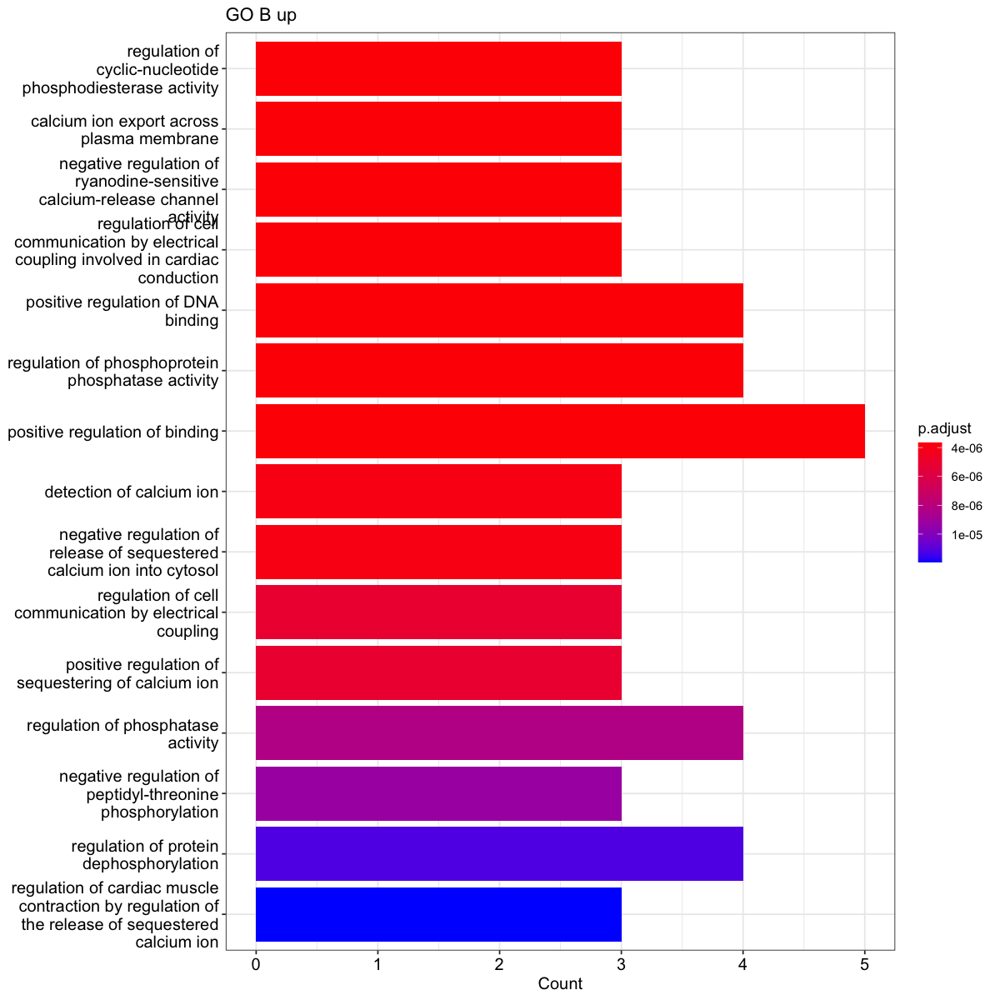

 'table' int [1:38(1d)] 31 17 8 4 4 3 3 3 2 2 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:38] "TLR4" "PDE1B" "PLAU" "LGALS3" ...
NULL
'data.frame':	38 obs. of  2 variables:
 $ SYMBOL  : chr  "TLR4" "PDE1B" "PLAU" "LGALS3" ...
 $ ENTREZID: chr  "7099" "5153" "5328" "3958" ...
NULL
[1] "HSPC"
[1] "down"
 'table' int [1:70(1d)] 21 10 8 5 5 5 3 3 3 2 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:70] "ADRA2A" "EPOR" "APOE" "CD36" ...
NULL


'select()' returned 1:1 mapping between keys and columns



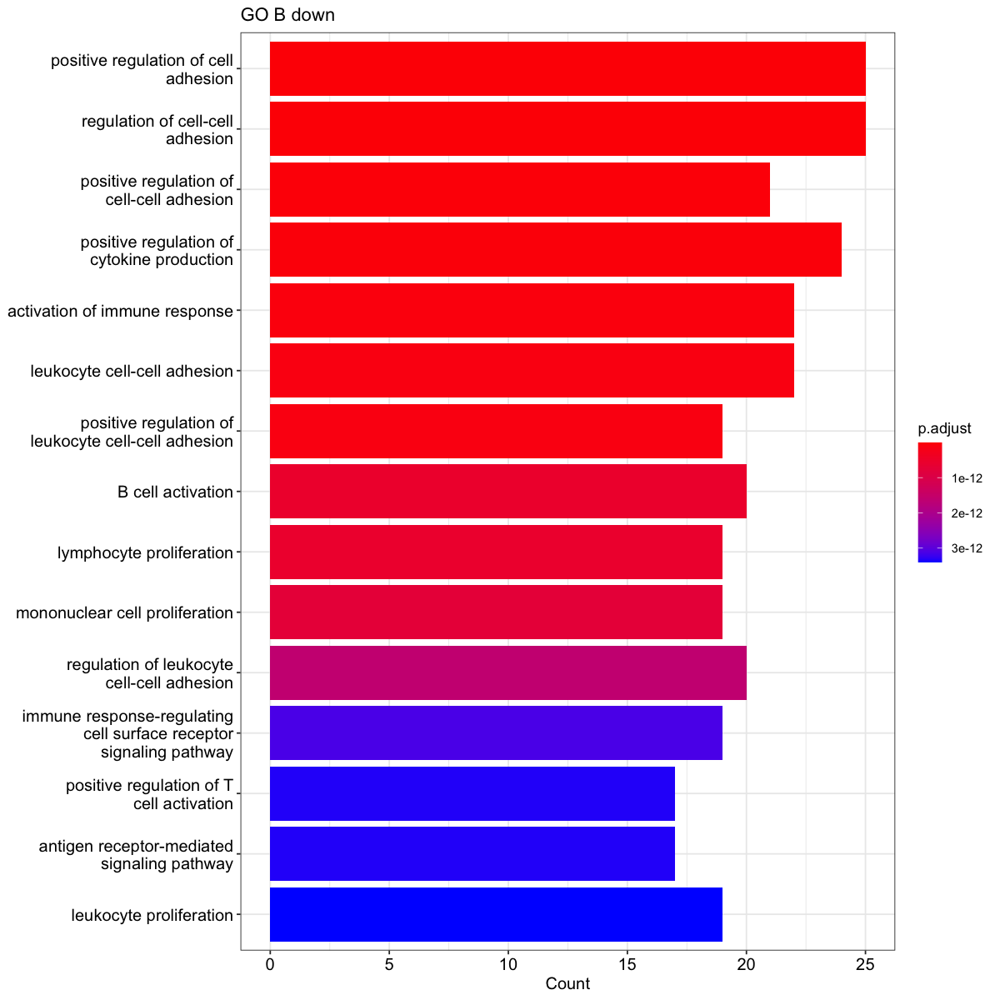

 'table' int [1:70(1d)] 21 10 8 5 5 5 3 3 3 2 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:70] "ADRA2A" "EPOR" "APOE" "CD36" ...
NULL
'data.frame':	70 obs. of  2 variables:
 $ SYMBOL  : chr  "ADRA2A" "EPOR" "APOE" "CD36" ...
 $ ENTREZID: chr  "150" "2057" "348" "948" ...
NULL
[1] "Ery"
[1] "up"
 'table' int [1:3(1d)] 2 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:3] "ADAM10" "MTMR4" "MUC1"
NULL


'select()' returned 1:1 mapping between keys and columns



 'table' int [1:3(1d)] 2 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:3] "ADAM10" "MTMR4" "MUC1"
NULL
'data.frame':	3 obs. of  2 variables:
 $ SYMBOL  : chr  "ADAM10" "MTMR4" "MUC1"
 $ ENTREZID: chr  "102" "9110" "4582"
NULL
[1] "Ery"
[1] "down"
 'table' int [1:134(1d)] 18 18 14 14 13 10 9 9 8 8 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:134] "ENG" "ITGB1" "CD320" "CD81" ...
NULL


'select()' returned 1:1 mapping between keys and columns



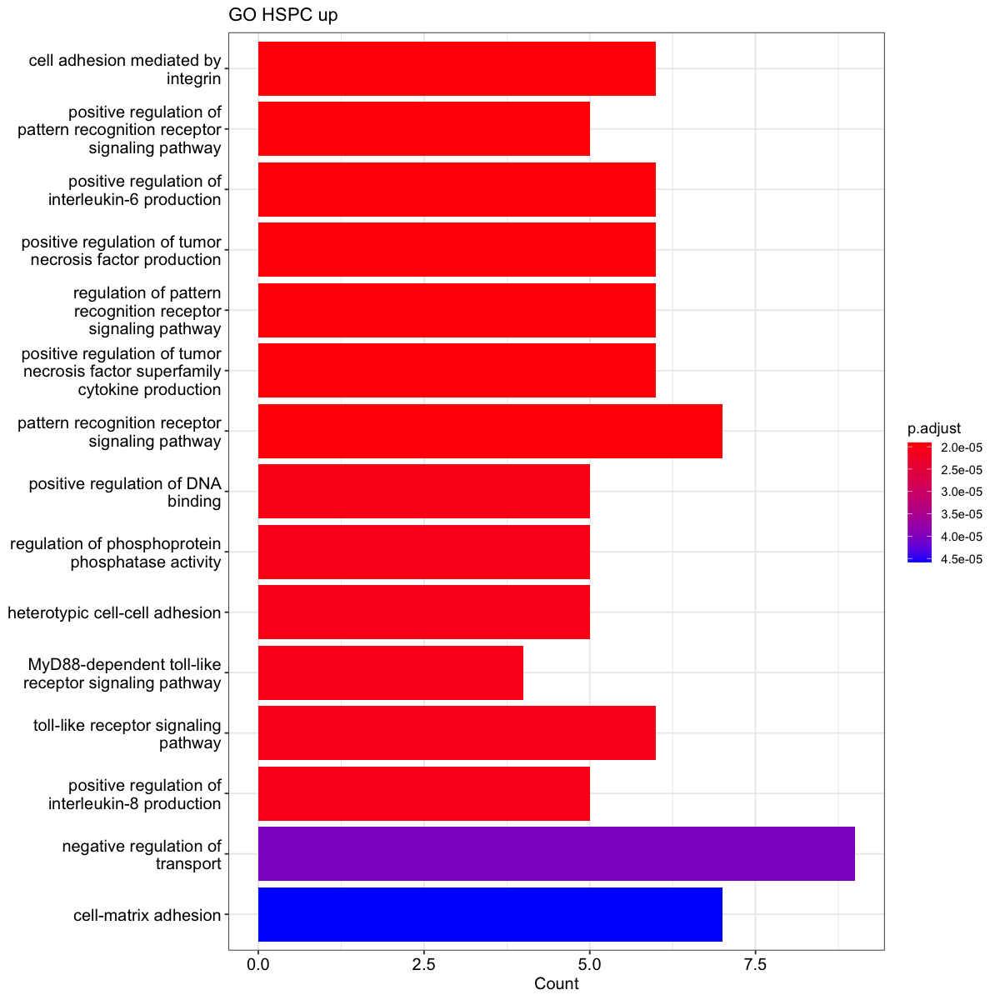

 'table' int [1:134(1d)] 18 18 14 14 13 10 9 9 8 8 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:134] "ENG" "ITGB1" "CD320" "CD81" ...
NULL
'data.frame':	100 obs. of  2 variables:
 $ SYMBOL  : chr  "ENG" "ITGB1" "CD320" "CD81" ...
 $ ENTREZID: chr  "2022" "3688" "51293" "975" ...
NULL
[1] "DC"
[1] "up"
 'table' int [1:5(1d)] 5 3 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:5] "SIGLEC10" "SORT1" "CALM1" "CD300LB" ...
NULL


'select()' returned 1:1 mapping between keys and columns



 'table' int [1:5(1d)] 5 3 1 1 1
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:5] "SIGLEC10" "SORT1" "CALM1" "CD300LB" ...
NULL
'data.frame':	5 obs. of  2 variables:
 $ SYMBOL  : chr  "SIGLEC10" "SORT1" "CALM1" "CD300LB" ...
 $ ENTREZID: chr  "89790" "6272" "801" "124599" ...
NULL
[1] "DC"
[1] "down"
 'table' int [1:255(1d)] 74 37 34 28 27 24 19 17 16 16 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:255] "LRP1" "AXL" "INSR" "RIPK1" ...
NULL


'select()' returned 1:1 mapping between keys and columns



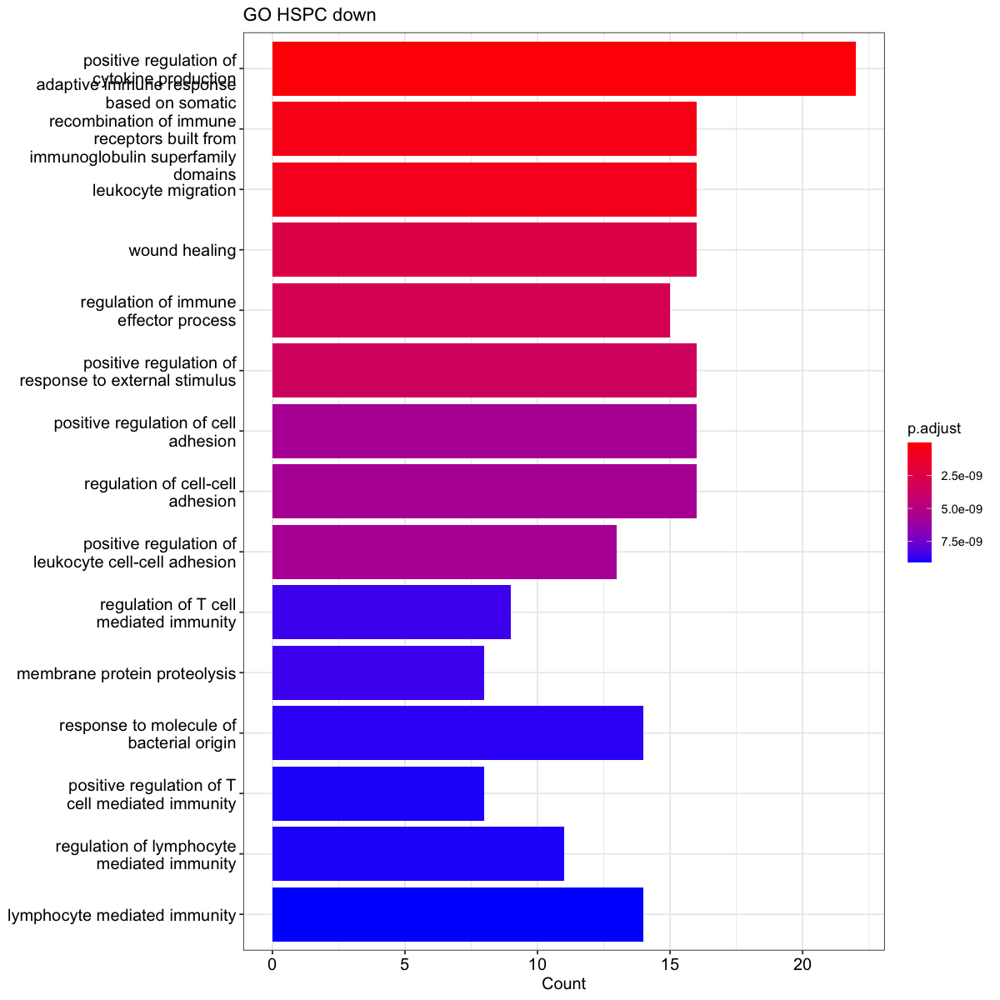

 'table' int [1:255(1d)] 74 37 34 28 27 24 19 17 16 16 ...
 - attr(*, "dimnames")=List of 1
  ..$ : chr [1:255] "LRP1" "AXL" "INSR" "RIPK1" ...
NULL
'data.frame':	100 obs. of  2 variables:
 $ SYMBOL  : chr  "LRP1" "AXL" "INSR" "RIPK1" ...
 $ ENTREZID: chr  "4035" "558" "3643" "8737" ...
NULL


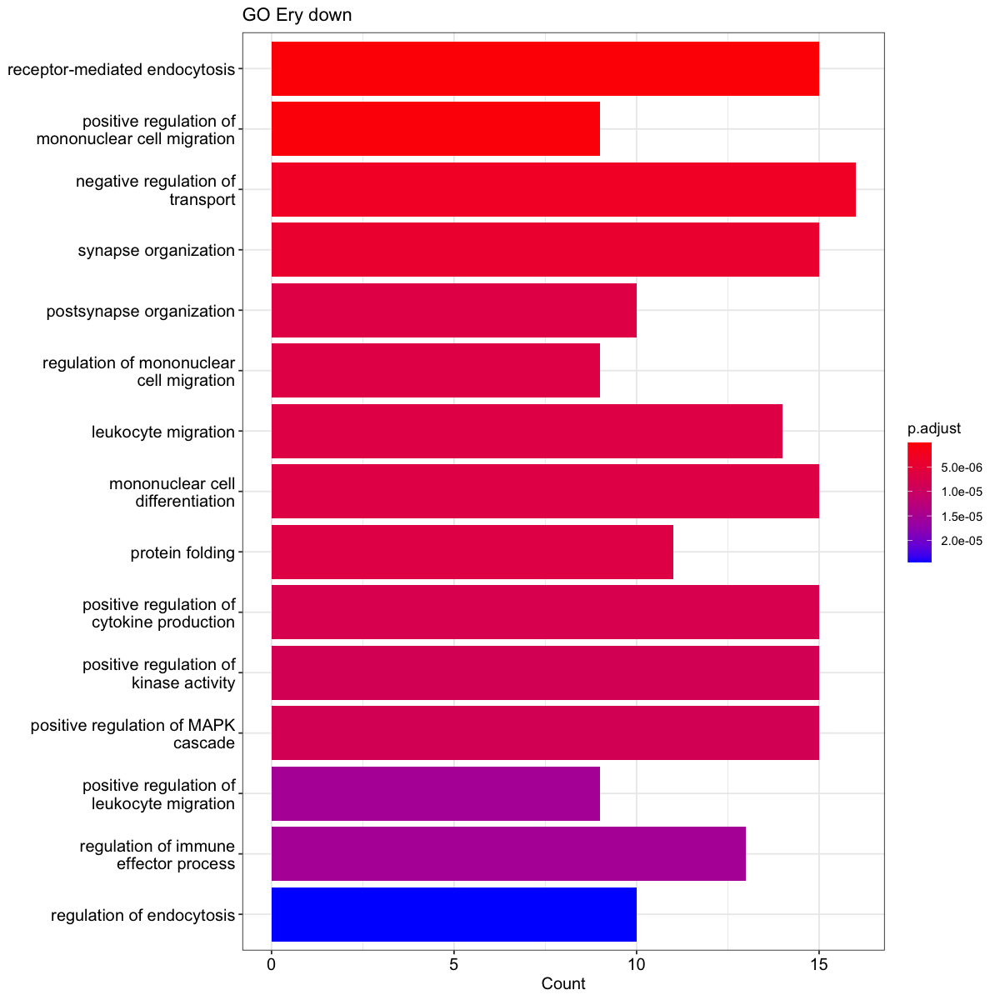

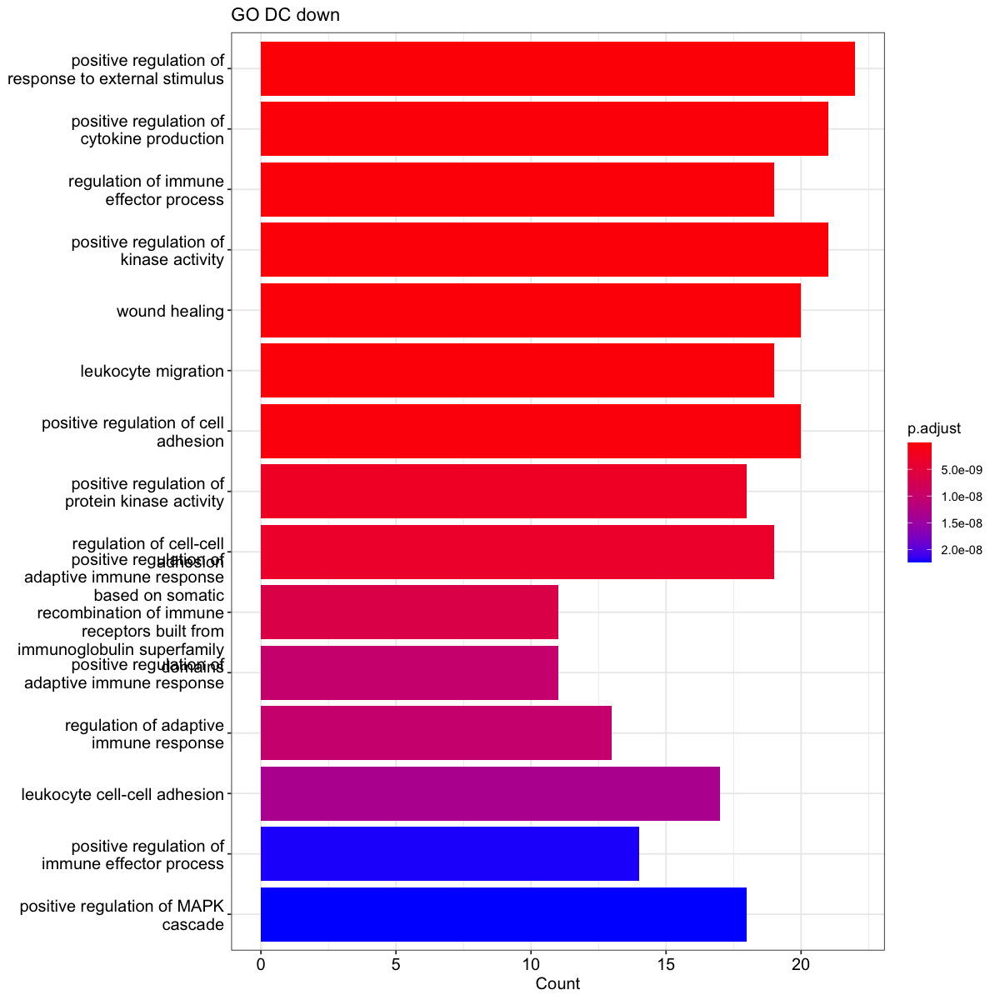

In [10]:
# enrichment of all ligs/rec in down / up-regulated interactions by cell type
options(repr.plot.width = 10
       ,repr.plot.height = 10)
cell_type <- unique(interactions$anno_cells$cell_type)
enrichment <- lapply(cell_type
                     ,function(my_cell_type){
                         
                         idx_sending <- interactions$anno_interactions$sending_cell_type == my_cell_type
                         idx_receiving <- interactions$anno_interactions$receiving_cell_type == my_cell_type
             my_analysis <- lapply(c("up"
                                  ,"down"
                                 )
                                ,function(direction){
                                     print(my_cell_type)
                                    print(direction)
                                    
          ifelse(direction == "up"
                ,idx <- idx_sign & idx_up
                ,idx <- idx_sign & idx_down)
          my_genes <- sort(table(c(interactions$anno_interactions$ligand_gene_name[idx & idx_sending]
                           ,interactions$anno_interactions$receptor_gene_name[idx & idx_receiving]))
                          ,decreasing = TRUE)
          print(str(my_genes))
          if(length(my_genes) != 0){
              ifelse(length(my_genes)< 100
                ,top <- c(1:length(my_genes))
                ,top <- c(1:100))
        genes  <-  AnnotationDbi::select(org.Hs.eg.db, keys=names(my_genes)[top], columns="ENTREZID", keytype="SYMBOL")
        genes  <-  genes[!is.na(genes$ENTREZID),]
        print(str(my_genes))
        print(str(genes))

        #my_background <- unique(c(interactions$anno_interactions$ligand_gene_name[idx_good]
        #                   ,interactions$anno_interactions$receptor_gene_name[idx_good]))
        #background = AnnotationDbi::select(org.Hs.eg.db, keys=my_background, columns="ENTREZID", keytype="SYMBOL")
        #background = background[!is.na(background$ENTREZID),]
        #print(str(my_background))
        #print(str(background))

          a <- lapply(c("GO"
                   #,"KEGG"
                                 )
                 ,function(type_analysis){
                     if(type_analysis == "GO"){
                         BP <- enrichGO(gene = genes$ENTREZID
                                            #,universe = background$ENTREZID
                                            , OrgDb = org.Hs.eg.db
                                            , ont = "BP"
                                            , pAdjustMethod = "BH"
                                            , pvalueCutoff  = 0.01
                                            , qvalueCutoff  = 0.05
                                            , readable = TRUE
                                           )
                         if(sum(unique(BP@result$p.adjust) < 0.01)>0){
                             print(barplot(BP, showCategory=15) + ggtitle(paste(type_analysis,my_cell_type,direction)))
                         }
                        return(BP)
                     } else {
                         kk <- enrichKEGG(gene = genes$ENTREZID
                                            #,universe = background$ENTREZID
                                              ,organism     = 'hsa'
                                              ,pvalueCutoff = 0.05
                                                 )
                        print(barplot(kk, showCategory=15) + ggtitle(paste(type_analysis,my_cell_type,direction)))
                         return(kk)
                     }


          })
              return(a)
              }
                           
      })
                         names(my_analysis) <- c("up", "down")
                         my_analysis
                     })
names(enrichment) <- cell_type
#print(str(enrichment))

In [11]:
print(str(enrichment))

List of 8
 $ Mono:List of 2
  ..$ up  :List of 1
  .. ..$ :Formal class 'enrichResult' [package "DOSE"] with 15 slots
  .. .. .. ..@ result       :'data.frame':	1106 obs. of  9 variables:
  .. .. .. .. ..$ ID         : chr [1:1106] "GO:0043388" "GO:0051099" "GO:0051651" "GO:0051342" ...
  .. .. .. .. ..$ Description: chr [1:1106] "positive regulation of DNA binding" "positive regulation of binding" "maintenance of location in cell" "regulation of cyclic-nucleotide phosphodiesterase activity" ...
  .. .. .. .. ..$ GeneRatio  : chr [1:1106] "5/19" "6/19" "6/19" "3/19" ...
  .. .. .. .. ..$ BgRatio    : chr [1:1106] "57/18903" "177/18903" "226/18903" "10/18903" ...
  .. .. .. .. ..$ pvalue     : num [1:1106] 2.35e-09 1.52e-08 6.51e-08 1.03e-07 1.03e-07 ...
  .. .. .. .. ..$ p.adjust   : num [1:1106] 2.59e-06 8.40e-06 1.95e-05 1.95e-05 1.95e-05 ...
  .. .. .. .. ..$ qvalue     : num [1:1106] 1.44e-06 4.65e-06 1.08e-05 1.08e-05 1.08e-05 ...
  .. .. .. .. ..$ geneID     : chr [1:1106] "CALM1

 chr [1:15, 1:8] "positive regulation of cytokine production" ...
 - attr(*, "dimnames")=List of 2
  ..$ : NULL
  ..$ : chr [1:8] "Mono" "Gran" "T" "NK" ...
NULL
 chr [1:54] "positive regulation of cytokine production" ...
NULL


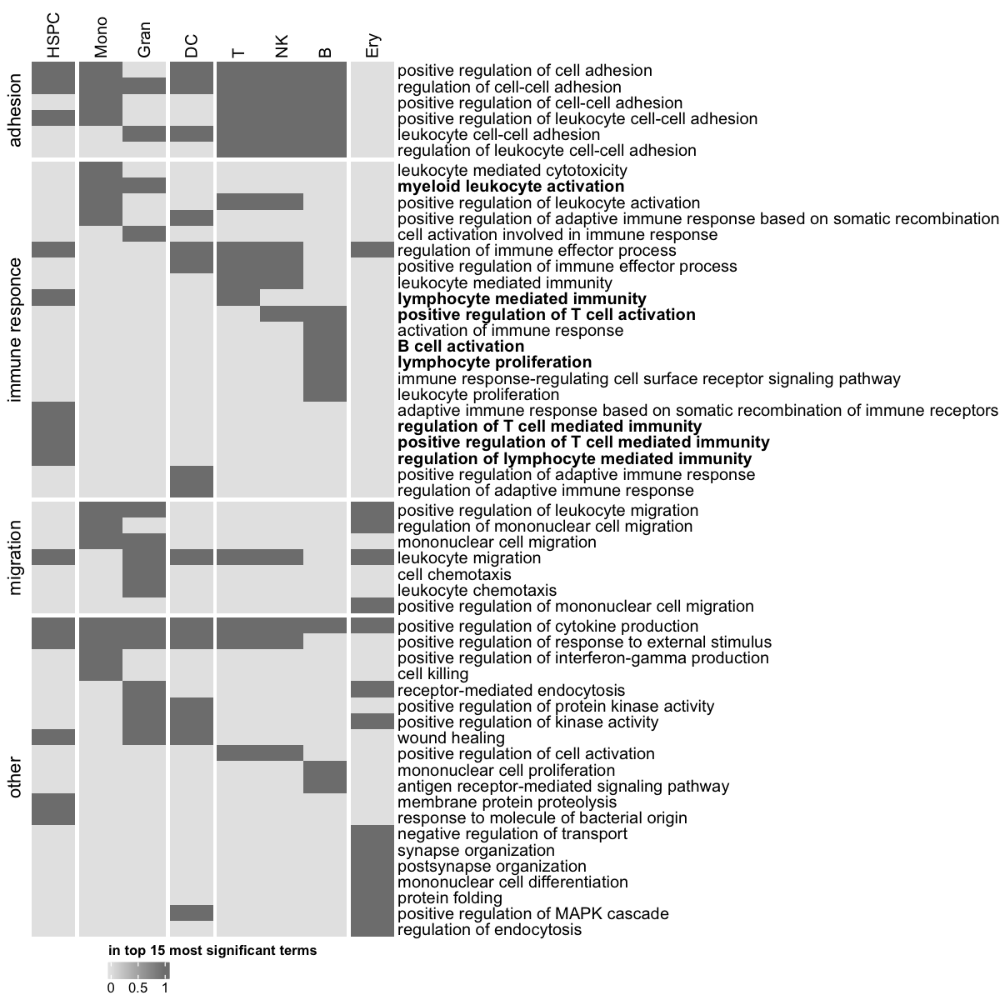

In [37]:
# extract top 15 most significant terms for down interaction for each cell type
top_downregulated <- sapply(cell_types
                           ,function(my_cell_type){
                               my_GO <- enrichment[[my_cell_type]]$down[[1]]@result
                               idx_sign <- my_GO$p.adjust < 0.01
                               return(my_GO$Description[idx_sign][1:15])
                           })
print(str(top_downregulated))

union <- unique(c(top_downregulated))
print(str(union))

# define classes of interactions
idx_adhesion <- grepl("adhesion",union)
#print("adhesion:")
#print(union[idx_adhesion])
idx_migration <- grepl("migration", union) | grepl("chemotaxis", union)
#print("")
#print("migration:")
#print(union[idx_migration])
idx_immune <- grepl("immune"
                    , union) | grepl("immunty"
                                     , union) | grepl("leukocyte"
                                                      , union) & (!idx_adhesion) & (!idx_migration) | grepl("B cell"
                                                                      ,union) | grepl("T cell"
                                                                                     ,union) | grepl("lymphocyte"
                                                                                                    ,union) 
#print("")
#print("immune:")
#print(union[idx_immune])
idx_rest <- !(idx_adhesion | idx_migration | idx_immune)
#print("")
#print("rest:")
#print(union[idx_rest])

summary <- as.data.frame(matrix(,nrow = length(union)
                               ,ncol = length(cell_types)))
rownames(summary) <- union
colnames(summary) <- cell_types
for(my_cell_type in cell_types){
    summary[,my_cell_type] <- rownames(summary) %in% top_downregulated[,my_cell_type]
}
#print(str(summary))
row_split <- c(rep("adhesion"
                  ,sum(idx_adhesion)
                  )
               ,rep("migration"
                   ,sum(idx_migration)
                   )
               ,rep("immune responce"
                   ,sum(idx_immune)
                   )
               ,rep("other"
                   ,sum(idx_rest))
              )
union_sorted <- c(union[idx_adhesion]
                           ,union[idx_migration]
                           ,union[idx_immune]
                           ,union[idx_rest])

names(row_split) <- union_sorted
#print(row_split)

summary <- summary[union_sorted,c("HSPC","Mono", "Gran", "DC", "T","NK", "B", "Ery")]

my_color <-  colorRamp2(seq(0,1, length = 2)
                            , c("gray90", "gray50"))
idx_highlighted <- grepl("B cell", union_sorted) | grepl("lymphocyte", union_sorted) | grepl("T cell",union_sorted) | grepl("myeloid", union_sorted)
highlight_fonts <- sapply(idx_highlighted, function(i) ifelse(i, "bold", "plain"))

h <- Heatmap(as.matrix(summary*1)
             ,column_order = c("HSPC","Mono", "Gran", "DC", "T","NK", "B", "Ery")
             ,column_names_side = "top"
             ,column_split = c(1,2,2,3,4,4,4,5)
             ,column_title=NULL
             #,column_names_rot = 90
             ,col = my_color
             ,row_split = row_split
             ,row_names_gp = gpar(fontface = highlight_fonts)
             ,cluster_rows = FALSE
            ,heatmap_legend_param = list(direction = "horizontal")
             ,row_names_max_width = unit(15, "cm")
             ,name="in top 15 most significant terms"
            )
ComplexHeatmap::draw(h
                    ,heatmap_legend_side = "bottom")

# Export

In [62]:
print("save interactions.RData")
save(interactions, file = "interactions.RData")

[1] "save interactions.RData"
